# 2024-01-30 30 - Implementing gridsearch and analyzing its impact.ipynb
Implement a gridsearch for constant constraint types with different constraint levels, and see how the results table look versus ERM.

## Parameters

In [163]:
FIGURES_FOLDER="../figures/icml"

## Libraries and setup

In [164]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [165]:
import sys
import os
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), os.pardir)))

In [166]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from IPython.display import display, Markdown, Latex

In [167]:
from utils import wandb_utils

## Data Download

### Resilience data

In [168]:
real_df_resilience=pd.read_pickle("../data_backups/2024_02_01_1038am__icml_backup_data.pkl")
# For now, only resilience

real_df_resilience = real_df_resilience.query('constraint_type=="constant_resilience" or constraint_type=="erm"')

In [169]:
real_df_resilience[['constraint_type','resilient_lr']].drop_duplicates()

,constraint_type,resilient_lr
169344,constant_resilience,0.1
764640,erm,NaN


In [170]:
CONSTRAINT_TYPE='constant_resilience'

### Non resilience data

In [171]:
# #READ
real_df=pd.read_pickle("../data_backups/2024_02_01_1038am__icml_backup_data.pkl")
# For now, only resilience

real_df = real_df.query('constraint_type=="constant" or constraint_type=="erm"')
CONSTRAINT_TYPE='constant'

KeyboardInterrupt: 

In [ ]:
# small_data_backup = df.copy() #the 6 runs tiny one

In [ ]:
df = real_df

In [ ]:
#df = raw_df.copy()
raw_df = df.copy()

In [ ]:
#TODO deleteme
df = df[df.seed==2021].copy()
df.run_id.nunique()

331

In [ ]:
df.groupby(['data_path','model','pred_len','seed'])['run_id'].nunique().reset_index()

,data_path,model,pred_len,seed,run_id
0,electricity.csv,Autoformer,96,2021,7
1,electricity.csv,Autoformer,192,2021,7
2,electricity.csv,Autoformer,336,2021,7
3,electricity.csv,Autoformer,720,2021,7
4,electricity.csv,Informer,96,2021,7
5,electricity.csv,Informer,192,2021,7
6,electricity.csv,Informer,336,2021,7
7,electricity.csv,Informer,720,2021,7
8,electricity.csv,Reformer,96,2021,7
9,electricity.csv,Reformer,192,2021,6


In [ ]:
runs_per_groupset=df.groupby(['data_path','model','pred_len','seed'])['run_id'].nunique().reset_index()
runs_per_groupset[runs_per_groupset.run_id!=7]

,data_path,model,pred_len,seed,run_id
9,electricity.csv,Reformer,192,2021,6
35,weather.csv,Autoformer,720,2021,4
40,weather.csv,Reformer,96,2021,6


## Data processing
This section contains processing specific to this experiment set. If you clone this notebook. Remove or refactor this section.

## Gridsearch function (todo extract into script)
Meant to be used on `df_constrained` (containing only constant constrained `df`)

In [ ]:
def gridsearch(runs_df, objective_col, gridsearch_keys, reference_cols, split='val',mode='mean'):
    """
    Performs a gridsearch across the runs under `gridsearch_keys`, with the objective of minimizing `objective_col`.
    
    Parameters
    ---
    mode: is either 'mean' or 'std', to choose which statistic of the objective value to use for the gridsearch.
    
    Returns 
    ---
    
        the runs_df filtered by the best runs, and the summary metric of the best runs.
    """
    grouped_cols = gridsearch_keys + reference_cols + ['constraint_level'] #todo maybe don't need to hardcode this
    summary_metric = objective_col

    run_gridsearch_stats = runs_df.query(f"split=='{split}'").groupby(grouped_cols).agg(
        mean_objective=(objective_col, 'mean'),
        std_objective=(objective_col, 'std'),
        #mean_constraint_violation=('constraint_violation', 'mean'), #is it worth having other stuff here?
        count=('step', 'size')
    ).reset_index().sort_values(['model', 'std_objective'])

    best_runs = run_gridsearch_stats.groupby(gridsearch_keys)[f'{mode}_objective'].idxmin()
    best_runs_df = run_gridsearch_stats.loc[best_runs, :]
    filtered_runs_df = runs_df[runs_df['run_id'].isin(best_runs_df['run_id'].unique())] #TODO run_id is a hard requirement in the group cols.

    return filtered_runs_df, best_runs_df[grouped_cols + [f'{mode}_objective']]

### Label constraint_levels (`constraint_idx` column)
useful for joining when the constraint values are different for each model.

In [ ]:
# There are three constraint levels per run, add a rank column, sorted by constraint level.
df=df.copy()#df_constrained.copy()
#display(df[['seed','data_path','model','pred_len','constraint_level']].drop_duplicates().sort_values(['data_path','model','pred_len','constraint_level']).head())
df.loc[df.constraint_type==CONSTRAINT_TYPE,'constraint_idx'] = df.query('constraint_type==@CONSTRAINT_TYPE').groupby(['seed','data_path','model','pred_len'])['constraint_level'].rank(method='dense', ascending=True).astype(int)
df.loc[df.constraint_type=='erm','constraint_idx'] = 0
df['constraint_idx'] = df['constraint_idx'].astype(int)
ranked_constraint_levels_summary = df[['run_id','data_path','model','pred_len','constraint_type','constraint_level','constraint_idx']].drop_duplicates('run_id').sort_values(['data_path','model','pred_len','constraint_level'])
print("Sanity checking on the summary")
ranked_constraint_levels_summary

Sanity checking on the summary


,run_id,data_path,model,pred_len,constraint_type,constraint_level,constraint_idx
796608,uglzgsuo,electricity.csv,Autoformer,96,erm,-1.000,0
714240,idtz7hic,electricity.csv,Autoformer,96,constant,0.113,1
713952,c4z5umai,electricity.csv,Autoformer,96,constant,0.117,2
713664,tickbccb,electricity.csv,Autoformer,96,constant,0.120,3
580608,3cluutoj,electricity.csv,Autoformer,96,constant,0.151,4
...,...,...,...,...,...,...,...
716688,lk945020,weather.csv,Transformer,720,constant,0.215,2
714528,ossb6hui,weather.csv,Transformer,720,constant,0.216,3
585216,zjxaal2j,weather.csv,Transformer,720,constant,0.787,4
583056,o4wl3w36,weather.csv,Transformer,720,constant,0.972,5


#### label constraints for resilience

In [ ]:
# There are three constraint levels per run, add a rank column, sorted by constraint level.
real_df_resilience=real_df_resilience.copy()#df_constrained.copy()
#display(df[['seed','data_path','model','pred_len','constraint_level']].drop_duplicates().sort_values(['data_path','model','pred_len','constraint_level']).head())
real_df_resilience.loc[real_df_resilience.constraint_type=='constant_resilience','constraint_idx'] = real_df_resilience.query('constraint_type=="constant_resilience"').groupby(['seed','data_path','model','pred_len'])['constraint_level'].rank(method='dense', ascending=True).astype(int)
real_df_resilience.loc[real_df_resilience.constraint_type=='erm','constraint_idx'] = 0
real_df_resilience['constraint_idx'] = real_df_resilience['constraint_idx'].astype(int)
ranked_constraint_levels_summary = real_df_resilience[['run_id','data_path','model','pred_len','constraint_type','constraint_level','constraint_idx']].drop_duplicates('run_id').sort_values(['data_path','model','pred_len','constraint_level'])
print("Sanity checking on the summary")
ranked_constraint_levels_summary

Sanity checking on the summary


,run_id,data_path,model,pred_len,constraint_type,constraint_level,constraint_idx
796608,uglzgsuo,electricity.csv,Autoformer,96,erm,-1.000,0
330624,rttdp6ef,electricity.csv,Autoformer,96,constant_resilience,0.111,1
447264,0d9sptym,electricity.csv,Autoformer,96,constant_resilience,0.115,2
330336,7b4xxa9i,electricity.csv,Autoformer,96,constant_resilience,0.118,3
304416,4yrvpcmy,electricity.csv,Autoformer,96,constant_resilience,0.151,4
...,...,...,...,...,...,...,...
448560,6a1s6u6q,weather.csv,Transformer,720,constant_resilience,0.215,2
335664,dp14p951,weather.csv,Transformer,720,constant_resilience,0.216,3
311760,n2nhx9xv,weather.csv,Transformer,720,constant_resilience,0.787,4
453456,389tqjsn,weather.csv,Transformer,720,constant_resilience,0.972,5


### Broadcast ERM runs with constraint levels and add gridsearch (`df_to_plot`)
to compare ERM with constrained, we need every ERM run repeated to pair it with a constrained run.

In [ ]:
#TODO this version of this is not suited for multiple constraint types in a single dataset (will aggregate across all types)
df_constrained = df.query('type=="Constrained"').copy()
df_constrained,best_runs = gridsearch(df_constrained,objective_col='mse', gridsearch_keys=['model', 'pred_len', 'data_path'],reference_cols=['run_id'],split='val')

###Now filter resilience runs to only gridsearched ones
resilience_runs=real_df_resilience[['data_path','model','pred_len','constraint_idx','run_id']].drop_duplicates(['data_path','model','pred_len','constraint_idx'])
gridsearched_runs=df_constrained[['data_path','model','pred_len','constraint_level','constraint_idx']].drop_duplicates()

# sometimes there are two resilience runs for one gridsearched run, so we need to drop duplicates
gridsearched_resilience_runs = gridsearched_runs.merge(resilience_runs,
                         on=['data_path','model','pred_len','constraint_idx'],how='inner') \
                             .drop_duplicates(['data_path','model','pred_len','constraint_idx'])[['run_id']].drop_duplicates()


real_df_resilience_gridsearched=real_df_resilience.merge(gridsearched_resilience_runs,on='run_id')
display(real_df_resilience_gridsearched.shape)

df_erm = df.query('type=="ERM"').copy()
#(data_path,model,pred_len,constraint_level,constrained_unconstraled)
distinct_constraints = df_constrained[['data_path','model','pred_len','constraint_idx','constraint_level']].drop_duplicates()


# crossjoin the ERM mse to all constraint levels
df_erm_w_broadcasted_constraint_levels = df_erm.drop(columns=['constraint_idx','constraint_level']).merge(distinct_constraints,on=['data_path','model','pred_len'],how='left')
df_to_plot = pd.concat([
    df_constrained,
    df_erm_w_broadcasted_constraint_levels,
    real_df_resilience_gridsearched
    ],axis=0)

# sanity check
#display(df_erm_w_broadcasted_constraint_levels.shape)
#print(f"Three constraints per experiment, broadcasted dataset size be equal to {df_erm.shape[0]*1}")
#display(df_to_plot.shape)
#print(f"Final dataset size should be equal to {df_constrained.shape[0]+df_erm.shape[0]*1}")

(48384, 109)

### Add constraint violation metric

In [ ]:
# Adding the constraint violation column
df_to_plot["constraint_violation"] = (df_to_plot.mse-df_to_plot.constraint_level).clip(lower=0)
df_to_plot['is_infeasible'] = (df_to_plot.constraint_violation>0)*1

# sanity check
dd=df_to_plot[['run_id','model','type','constraint_type','step','mse','constraint_level','constraint_violation','is_infeasible']].sort_values('run_id')
print("For ERM")
display(dd.query('type=="ERM"').query('constraint_violation>0').head())
print("For Constrained")
display(dd.query('type=="Constrained"').query('constraint_violation>0').head())
print("For resilient")
display(dd.query('constraint_type=="constant_resilience"').query('constraint_violation>0').head())


For ERM


,run_id,model,type,constraint_type,step,mse,constraint_level,constraint_violation,is_infeasible
28120,092u33lj,Reformer,ERM,erm,88,0.312355,0.15,0.162355,1
28173,092u33lj,Reformer,ERM,erm,45,0.200621,0.15,0.050621,1
28174,092u33lj,Reformer,ERM,erm,46,0.200275,0.15,0.050275,1
28176,092u33lj,Reformer,ERM,erm,48,0.200807,0.15,0.050807,1
28177,092u33lj,Reformer,ERM,erm,49,0.201362,0.15,0.051362,1


For Constrained


,run_id,model,type,constraint_type,step,mse,constraint_level,constraint_violation,is_infeasible
43199,1ue2lfo7,Autoformer,Constrained,constant_resilience,143,0.208963,0.207,0.001963,1
43200,1ue2lfo7,Autoformer,Constrained,constant_resilience,144,0.209202,0.207,0.002202,1
43201,1ue2lfo7,Autoformer,Constrained,constant_resilience,145,0.209190,0.207,0.002190,1
43202,1ue2lfo7,Autoformer,Constrained,constant_resilience,146,0.209138,0.207,0.002138,1
43203,1ue2lfo7,Autoformer,Constrained,constant_resilience,147,0.209394,0.207,0.002394,1


For resilient


,run_id,model,type,constraint_type,step,mse,constraint_level,constraint_violation,is_infeasible
43199,1ue2lfo7,Autoformer,Constrained,constant_resilience,143,0.208963,0.207,0.001963,1
43200,1ue2lfo7,Autoformer,Constrained,constant_resilience,144,0.209202,0.207,0.002202,1
43201,1ue2lfo7,Autoformer,Constrained,constant_resilience,145,0.209190,0.207,0.002190,1
43202,1ue2lfo7,Autoformer,Constrained,constant_resilience,146,0.209138,0.207,0.002138,1
43203,1ue2lfo7,Autoformer,Constrained,constant_resilience,147,0.209394,0.207,0.002394,1


### Summary metrics per run
Summarize all three runs into metrics per split by averaging mse and constraint levels.

In [ ]:
df_to_plot.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 145152 entries, 486288 to 48383
Columns: 111 entries, des to is_infeasible
dtypes: bool(6), float64(38), int64(38), object(29)
memory usage: 118.2+ MB


In [ ]:
# Calculate mean and std for mse and constraint_violation. Rename them mean_{metric} and std_{metric

summary_metrics_per_run = df_to_plot.groupby([
    "data_path",
    "model",
    "pred_len",
    "run_id",
    "Algorithm", #Harmless carryover col for legacy purposes (verified the counts are the same)
    "constraint_type",
    'type',
    "constraint_idx",
    "split",
    "constraint_level",
    ])['mse','constraint_violation','infeasible_rate','run_id'].aggregate(
        mse=('mse','mean'),
        window_std=('mse','std'),
        #std_mse=('mse','std'),
        mcv=('constraint_violation','mean'),
        #std_mcv=('constraint_violation','std'),
        mean_infeasible_rate=('infeasible_rate','mean'),
        #std_infeasible_rate=('infeasible_rate','std'),
        run_count=('run_id','nunique')
        ).reset_index().round(5)
summary_metrics = summary_metrics_per_run.groupby([
    "data_path",
    "model",
    "pred_len",
    'type', #ERM or constrained
    "constraint_type",
    "split",
    "Algorithm",
    "constraint_idx",
    "constraint_level",
    ]).aggregate(
        mse=('mse','mean'),
        window_std=('window_std','mean'),
        std_mse=('mse','std'),
        mcv=('mcv','mean'),
        std_mcv=('mcv','std'),
        mean_infeasible_rate=('mean_infeasible_rate','mean'),
        std_infeasible_rate=('mean_infeasible_rate','std'),
        run_count=('run_count','mean')
    ).reset_index()
display(summary_metrics_per_run.shape)
display(summary_metrics.shape)
summary_metrics.head()

/home/jporras/miniconda3/envs/autoformer/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  


(432, 15)

(432, 17)

,data_path,model,pred_len,type,constraint_type,split,Algorithm,constraint_idx,constraint_level,mse,window_std,std_mse,mcv,std_mcv,mean_infeasible_rate,std_infeasible_rate,run_count
0,electricity.csv,Autoformer,96,Constrained,constant,test,electricity Autoformer,1,0.113,0.20018,0.01513,NaN,0.08718,NaN,1.00000,NaN,1.0
1,electricity.csv,Autoformer,96,Constrained,constant,train,electricity Autoformer,1,0.113,0.11591,0.00943,NaN,0.00407,NaN,0.51042,NaN,1.0
2,electricity.csv,Autoformer,96,Constrained,constant,val,electricity Autoformer,1,0.113,0.15709,0.01001,NaN,0.04409,NaN,0.99974,NaN,1.0
3,electricity.csv,Autoformer,96,Constrained,constant_resilience,test,electricity Autoformer,1,0.111,0.21951,0.01303,NaN,0.10851,NaN,1.00000,NaN,1.0
4,electricity.csv,Autoformer,96,Constrained,constant_resilience,train,electricity Autoformer,1,0.111,0.15670,0.01156,NaN,0.04570,NaN,0.39583,NaN,1.0


**END OF PREPROCESSING**

---
---

## Plots

### PAPER: ERM vs. Constrained on 50th percentile on all datasets (one seed)

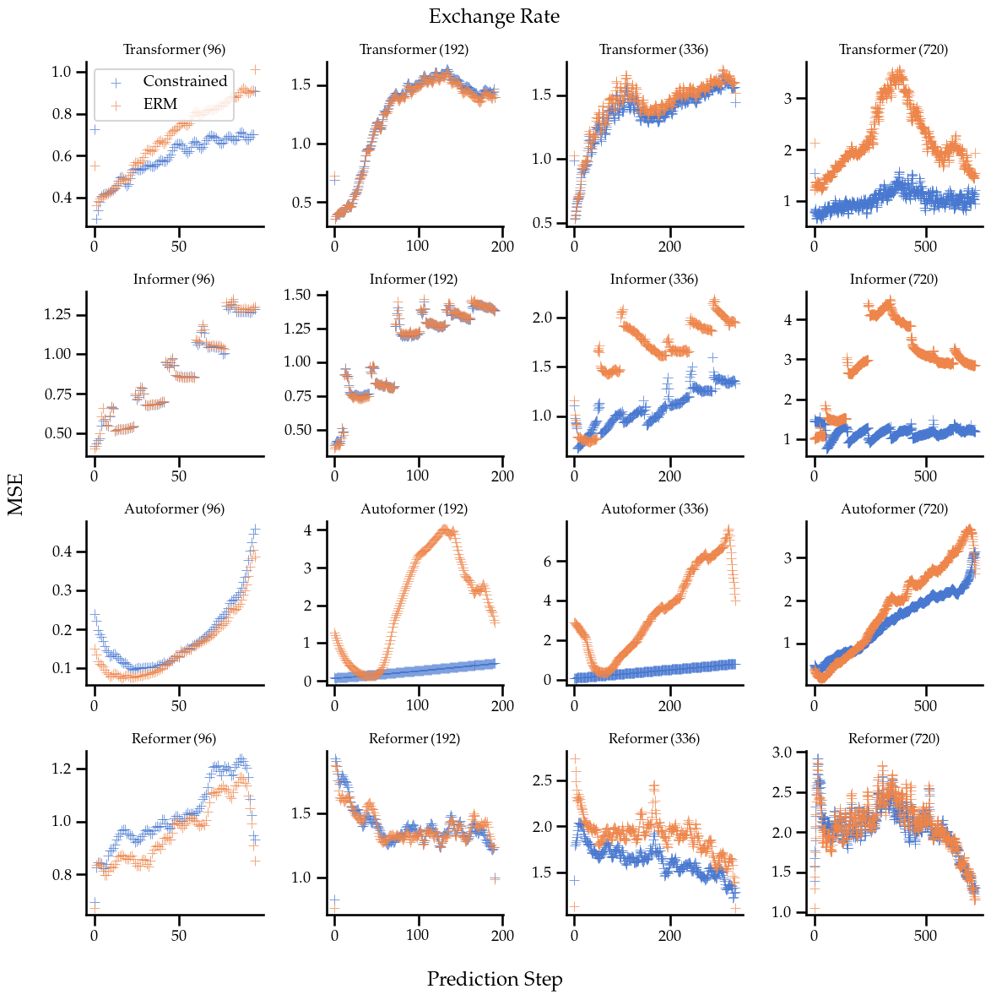

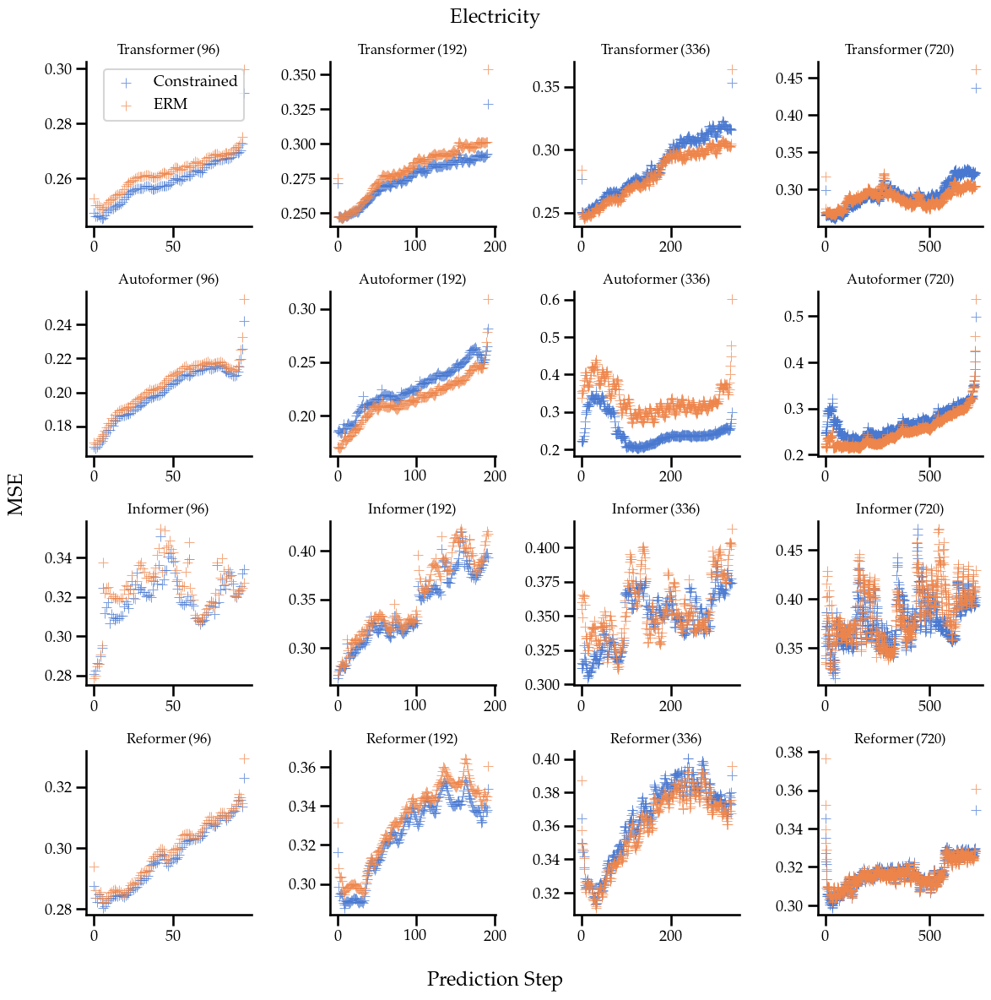

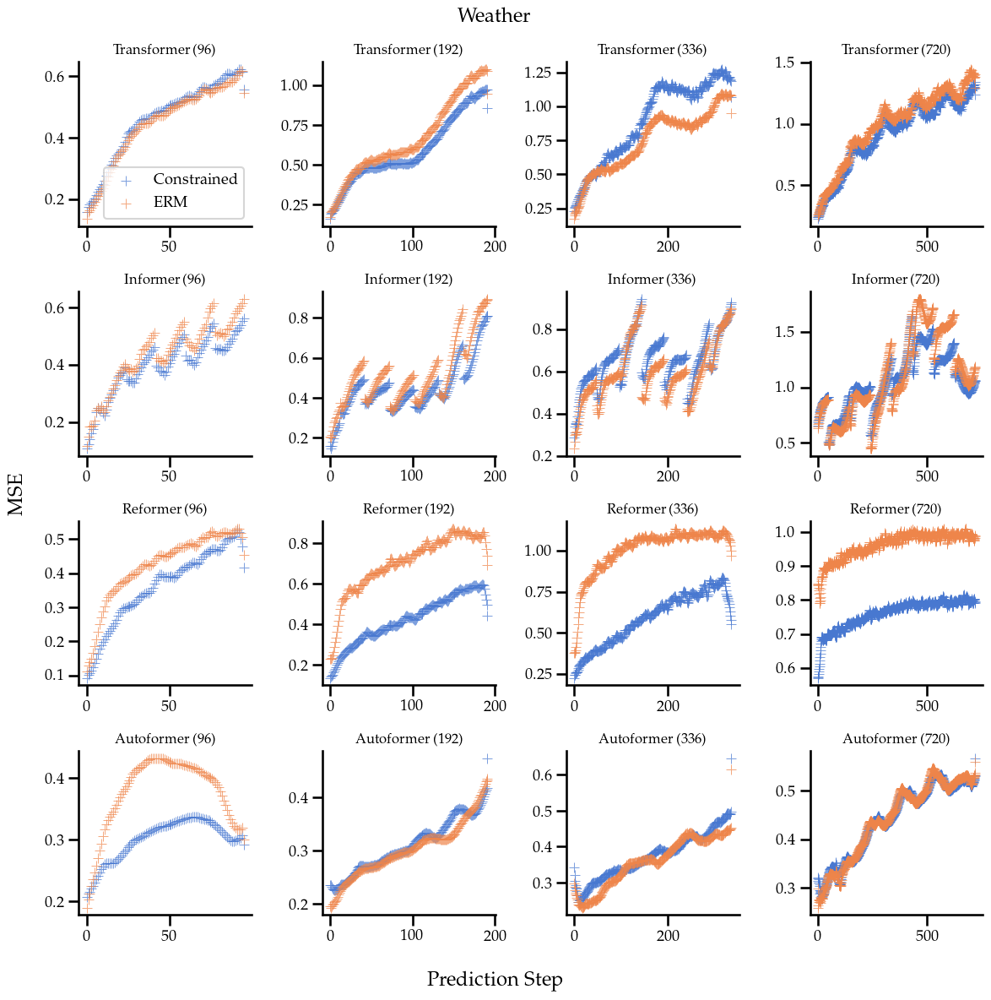

In [262]:
# PARAMS
split="test"
#constraint_idx = 1 # use the 50 percentile constraint to plot 1=25,2=50,3=75
seed=2021

sns.set_palette("muted")
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})
mpl.rcParams['lines.linewidth'] = 1.8

# Filter
df_pct50_and_erm = df_to_plot[(df_to_plot.seed==seed) & (df_to_plot.split==split) & (df_to_plot.constraint_type!='constant_resilience')].copy()

PRED_LENS=sorted(df_to_plot.pred_len.unique().tolist())
#PRED_LENS=[720]
#PRED_LENS=[96]

def pretty_name_dataset(data_path):
    if data_path=="electricity.csv": 
        return "Electricity"
    if data_path=="weather.csv":
        return "Weather"
    if data_path=="exchange_rate.csv":
        return "Exchange Rate"

def sample_every_n(df,groupcols=['data_path','model','pred_len','split'],n=2):
    """
    Returns DF but only every nth row with respect to step within each group.
    """
    df_sampled = df.groupby(groupcols).apply(lambda x: x[(x.step//48)%n==0]).reset_index(drop=True)
    return df_sampled
    

#for pred_len in PRED_LENS:
for data_path in df_pct50_and_erm.data_path.unique():
    # Add data for constant line
    #df_current_plot = df_pct50_and_erm.query('pred_len==@pred_len').copy()
    df_current_plot = df_pct50_and_erm.query('data_path==@data_path').copy()
    df_current_plot['constraint_type'].replace({'erm':'ERM','constant':'Constrained'},inplace=True)
    #constraint_level = df_current_plot.constraint_level.unique()[0]
    #df_current_plot['constraint_level'] = constraint_level
    #display(Markdown(f"#### **ERM Vs Constrained {pred_len} (split={split})**"))

    g = sns.FacetGrid(
                    #sample_every_n(df_current_plot),
                    df_current_plot,
                    #df_current_plot,
                    row='model', 
                    col='pred_len', 
                    hue='constraint_type', 
                    height=3, 
                    aspect=1.0, 
                    legend_out=False,
                    #legend='full',
                    sharex=False,
                    sharey=False,
                    )
    #g.set_titles(row_template="", col_template="")
    
    #g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
    g.map(sns.scatterplot, "step", "mse",marker='+',alpha=0.7,legend='full',edgecolor=None)
    g.add_legend()
    
    g.set_xlabels("")
    g.set_ylabels("")
    g.set_titles(template="{row_name} ({col_name})")
    g.fig.supxlabel("Prediction Step")
    g.fig.supylabel("MSE")
    g.fig.suptitle(f'{pretty_name_dataset(data_path)}')
    for ax in g.axes.flat:
        ax.set_title(ax.get_title(), fontsize='small')
        ax.set_xlabel(ax.get_xlabel(), fontsize='large')
        ax.set_ylabel(ax.get_ylabel(), fontsize='large')

    # make markers bigger
    for ax in g.axes.flat:
        for p in ax.patches:
            p.set( markersize=20)
    # disable legend
    #g._legend.remove()
    g._legend.set_title("")
    # legend fontsizesmall
    #g._legend.texts
    #g._legend.set_frame_on(False)
    # tight layout
    g.fig.tight_layout()
    
    #TODO fix and uncomment
    name_without_extension = data_path.split(".")[0]
    g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_all_{name_without_extension}.pdf")
    #plt.show()

### Train vs test

#### **ERM Vs Constrained exchange_rate.csv--96**

#### **ERM Vs Constrained exchange_rate.csv--96**

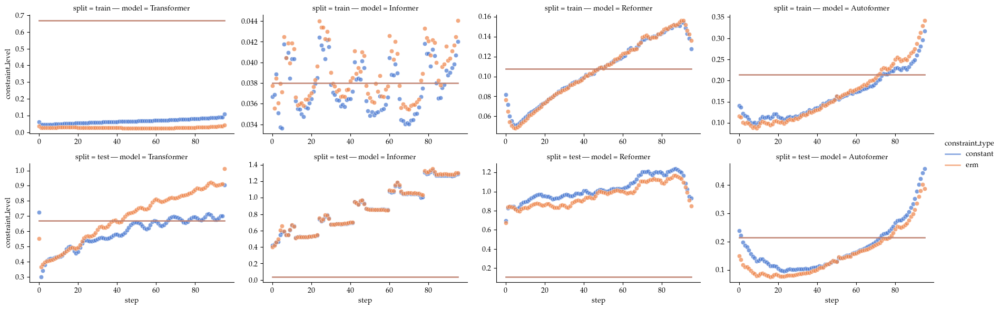

#### **ERM Vs Constrained exchange_rate.csv--192**

#### **ERM Vs Constrained exchange_rate.csv--192**

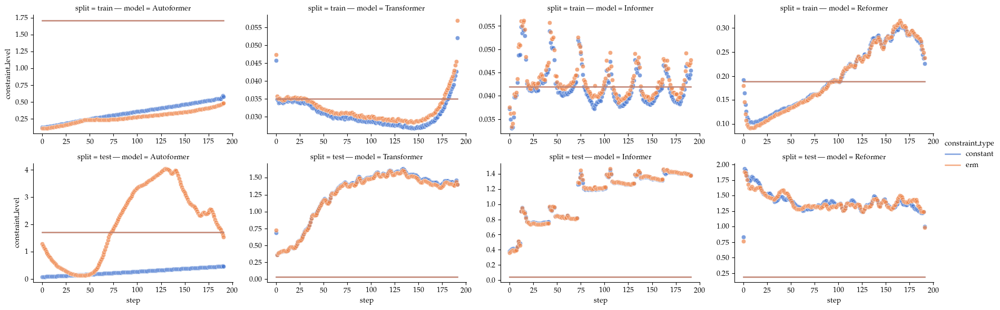

#### **ERM Vs Constrained exchange_rate.csv--336**

#### **ERM Vs Constrained exchange_rate.csv--336**

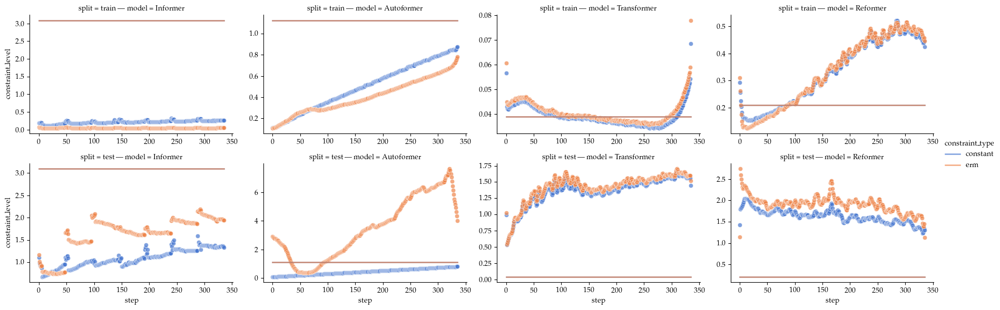

#### **ERM Vs Constrained exchange_rate.csv--720**

#### **ERM Vs Constrained exchange_rate.csv--720**

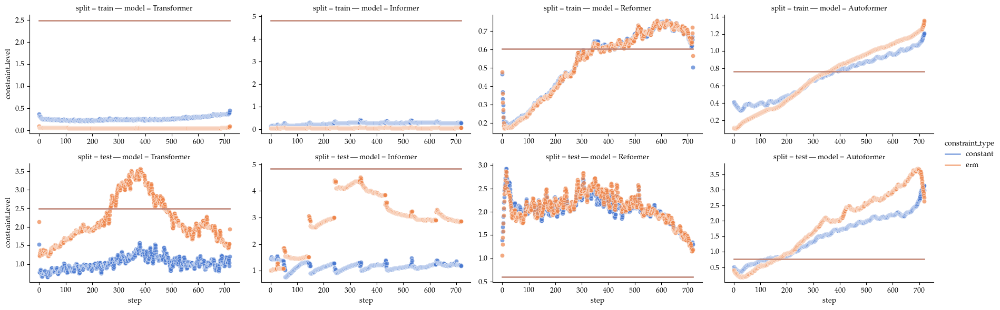

#### **ERM Vs Constrained electricity.csv--96**

#### **ERM Vs Constrained electricity.csv--96**

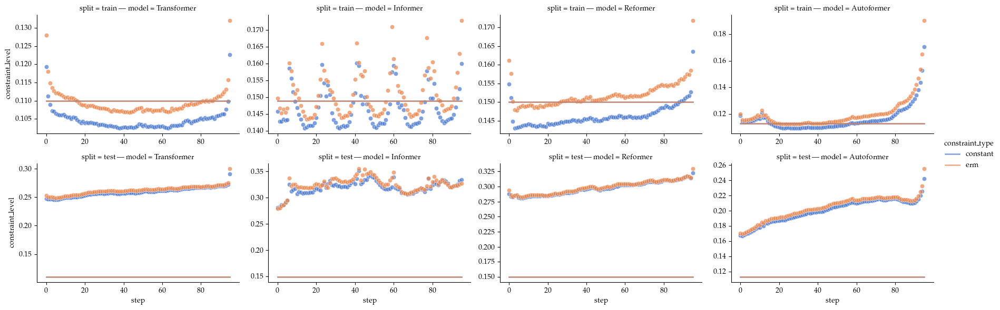

#### **ERM Vs Constrained electricity.csv--192**

#### **ERM Vs Constrained electricity.csv--192**

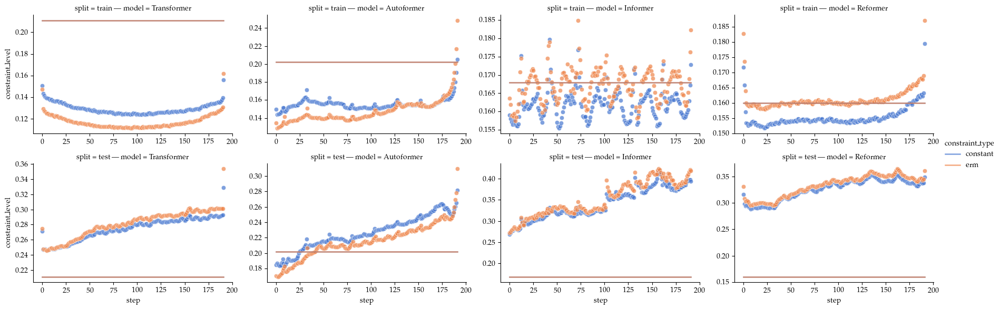

#### **ERM Vs Constrained electricity.csv--336**

#### **ERM Vs Constrained electricity.csv--336**

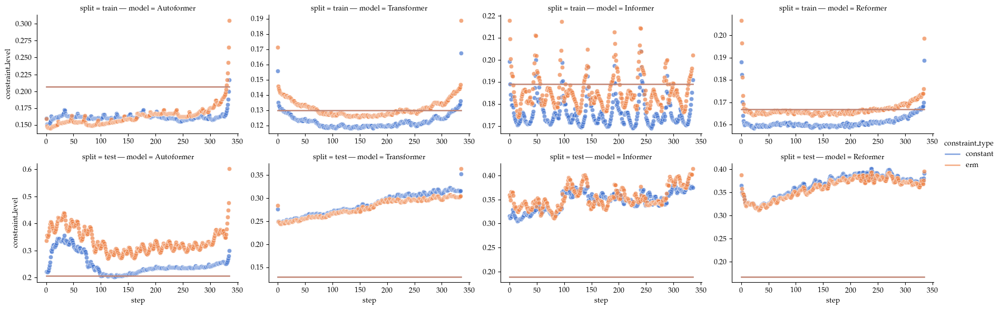

#### **ERM Vs Constrained electricity.csv--720**

#### **ERM Vs Constrained electricity.csv--720**

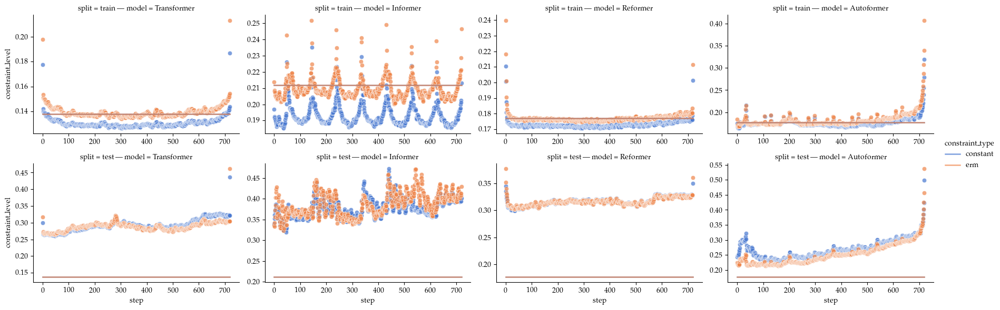

#### **ERM Vs Constrained weather.csv--96**

#### **ERM Vs Constrained weather.csv--96**

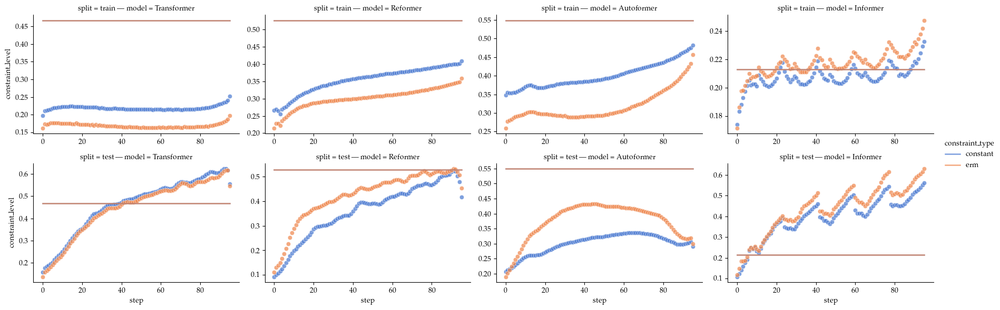

#### **ERM Vs Constrained weather.csv--192**

#### **ERM Vs Constrained weather.csv--192**

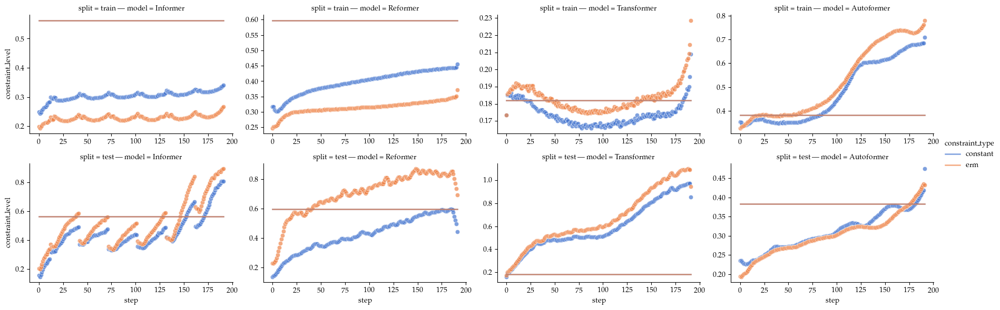

#### **ERM Vs Constrained weather.csv--336**

#### **ERM Vs Constrained weather.csv--336**

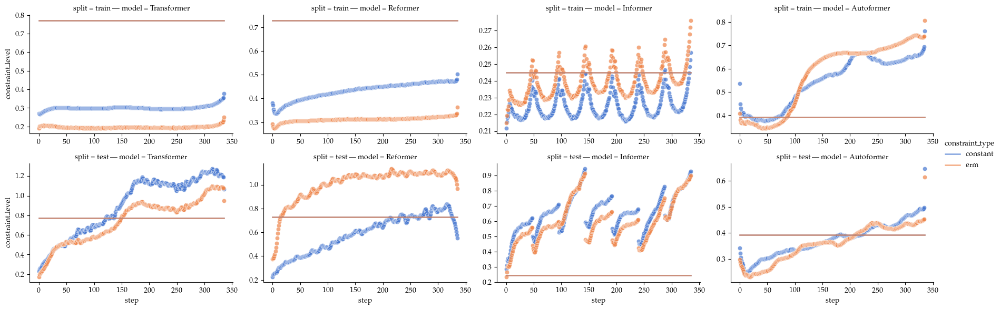

#### **ERM Vs Constrained weather.csv--720**

#### **ERM Vs Constrained weather.csv--720**

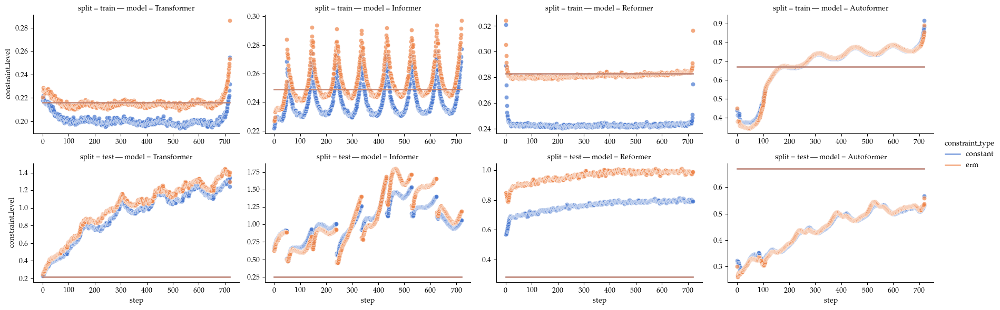

In [ ]:
# PARAMS
#split="test"
#constraint_idx = 1 # use the 50 percentile constraint to plot 1=25,2=50,3=75
seed=2021

# Filter
df_pct50_and_erm = df_to_plot[(df_to_plot.seed==seed) & (df_to_plot.split.isin(['train','test'])) & (df_to_plot.constraint_type.isin(['erm','constant']))].copy()

PRED_LENS=sorted(df_to_plot.pred_len.unique().tolist())
#PRED_LENS=[720]
#PRED_LENS=[96]
#for model in df_to_plot.model.unique():
for data_path in df_to_plot.data_path.unique():
    for pred_len in PRED_LENS:
        # Add data for constant line
        df_current_plot = df_pct50_and_erm.query('pred_len==@pred_len and data_path==@data_path').copy()
        mses=df_current_plot.groupby(['model','split','constraint_type'])['mse'].mean().reset_index()
        # plot only if train constant is lower than train erm and test constant is higher than test erm
        # if mses.query('split=="train"').query('constraint_type=="constant"').mse.values[0] < mses.query('split=="train"').query('constraint_type=="erm"').mse.values[0] and \
        #     mses.query('split=="test"').query('constraint_type=="constant"').mse.values[0] > mses.query('split=="test"').query('constraint_type=="erm"').mse.values[0]:
        display(Markdown(f"#### **ERM Vs Constrained {data_path}--{pred_len}**"))
    
        #constraint_level = df_current_plot.constraint_level.unique()[0]
        #df_current_plot['constraint_level'] = constraint_level
        display(Markdown(f"#### **ERM Vs Constrained {data_path}--{pred_len}**"))

        g = sns.FacetGrid(df_current_plot, col='model', row='split', hue='constraint_type', height=3, aspect=1.5, legend_out=True,sharex=False,sharey=False)
        #g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
        g.map(sns.scatterplot, "step", "mse", alpha=.7)
        g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
        g.add_legend()
        #TODO fix and uncomment
        #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{pred_len}_{str(constraint_level).replace('.','')}.png")
        plt.show()

#### Train vs test select example!!!

(424, 111)
success


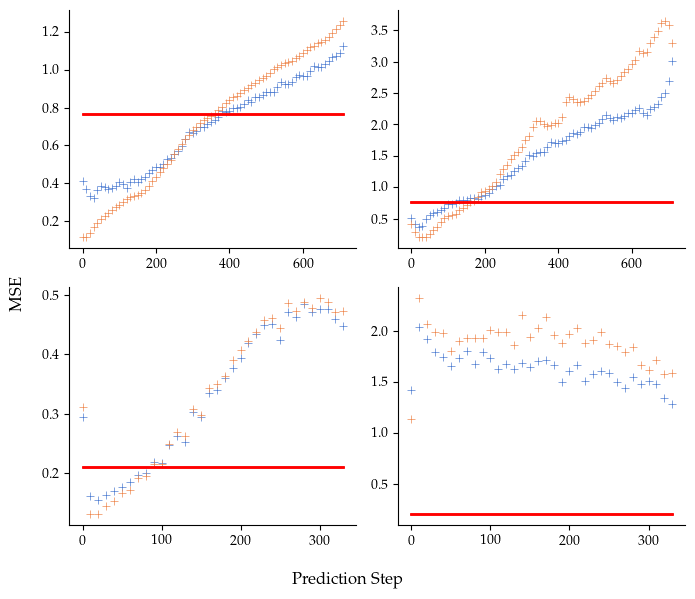

(2112, 111)
failures


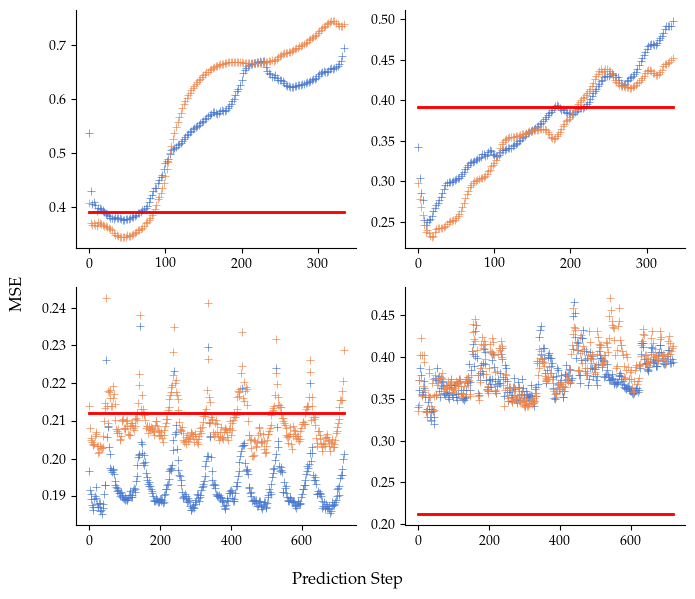

In [ ]:
import matplotlib as mpl
# Get the two success cases and two failures cases in separate dfs
# constant and erm
#**ECL192 transformer**
#**Weather 192 REformer
#Drop this one in favor of a more textbook one
#success1 = df_to_plot.query('data_path=="electricity.csv" and pred_len==192 and split!="val" and model=="Transformer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
success1 = df_to_plot.query('data_path=="exchange_rate.csv" and pred_len==720 and split!="val" and model=="Autoformer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
success2 = df_to_plot.query('data_path=="exchange_rate.csv" and pred_len==336 and split!="val" and model=="Reformer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
#**Weather 332 Autoformer**
#**Electricity 720 Informer**
failure1 = df_to_plot.query('data_path=="weather.csv" and pred_len==336 and split!="val" and model=="Autoformer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
failure2 = df_to_plot.query('data_path=="electricity.csv" and pred_len==720 and split!="val" and model=="Informer" and (constraint_type=="constant" or constraint_type=="erm")').copy()


sns.set_palette("muted")
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})
mpl.rcParams['lines.linewidth'] = 1.8

# add only one x axis label
g.set_xlabels("")
g.set_ylabels("")
# set axis label at the figure level
# add the hline
# for ax in g.axes:
#     ax.axhline(y=constraint_level, color='r', linestyle='-')
g.fig.supxlabel("Prediction Step")
g.fig.supylabel("MSE")


#TODO
g.set_titles(col_template="{col_name}")


# evens = df_set1["step"]%10
# df_set1 = df_set1[evens==0]
# evens = df_set2["step"]%2
# df_set2 = df_set2[evens==0]

    
# Plot all cases
success = pd.concat([success1,success2])
failures = pd.concat([failure1,failure2])
for plot_data,figname in [
    # (success1,"success_electricity_transformer_192"),
    # (success2,"success_weather_reformer_192"),
    # (failure1,"failure_weather_autoformer_332"),
    # (failure2,"failure_electricity_informer_720")
    (success,"success"),
    (failures,"failures")
    ]:
    # print(failure1.shape)
    # print(failure2.shape)
    if plot_data.pred_len.iloc[0]>500:
        evens = plot_data["step"]%10
        plot_data = plot_data[evens==0]
    # elif plot_data.pred_len.iloc[0]==336:
    #     evens = plot_data["step"]%4
    #     plot_data = plot_data[evens==0]
    else: 
        evens = plot_data["step"]%2
        plot_data = plot_data[evens==0]
    print(plot_data.shape)
    print(figname)
    g = sns.FacetGrid(plot_data, row="model",col='split', hue='constraint_type', height=3, aspect=1.0, legend_out=True,sharex=False,sharey=False)
    g.map(sns.scatterplot, "step", "mse", legend='full', marker='+')
    g.map(sns.lineplot, "step", "constraint_level", legend='full',color='red')
    
    g.add_legend()
    
    g.set_xlabels("")
    g.set_ylabels("")
    g.set_titles(col_template="{col_name}")
    g.fig.supxlabel("Prediction Step")
    g.fig.supylabel("MSE")
    for ax in g.axes.flat:
        ax.set_title("", fontsize='large')
        ax.set_xlabel(ax.get_xlabel(), fontsize='large')
        ax.set_ylabel(ax.get_ylabel(), fontsize='large')

    # make markers bigger
    for ax in g.axes.flat:
        for p in ax.patches:
            p.set( markersize=20)
    # disable legend
    g._legend.remove()
    # tight layout
    g.fig.tight_layout()
    g.savefig(f"../figures/icml/{figname}.pdf")
    plt.show()

# g = sns.FacetGrid(df_current_plot, col='model', row='split', hue='constraint_type', height=3, aspect=1.5, legend_out=True,sharex=False,sharey=False)
# #g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
# g.map(sns.scatterplot, "step", "mse", alpha=.7)
# g.add_legend()
# #TODO fix and uncomment
# #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{pred_len}_{str(constraint_level).replace('.','')}.png")
# plt.show()

### Multipliers over the window

#### **Multipliers vs loss 96 (split=train, constraint_idx=2)**

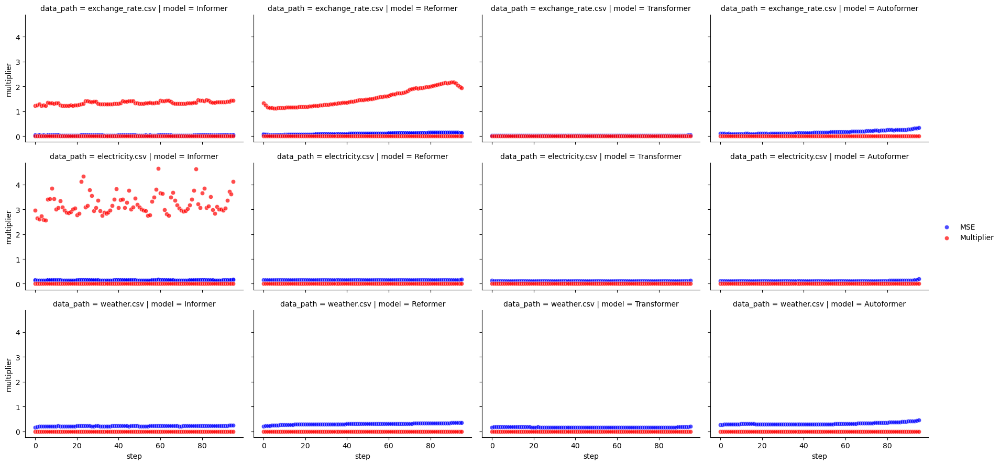

#### **Multipliers vs loss 192 (split=train, constraint_idx=2)**

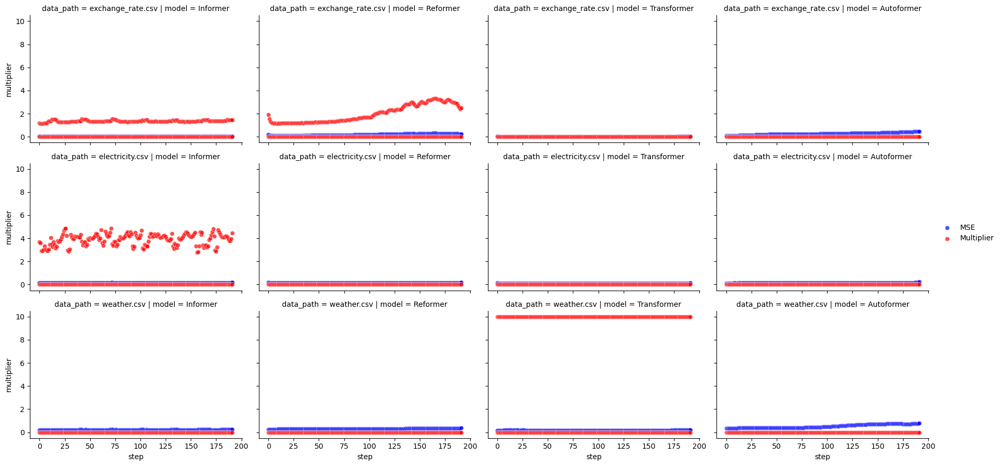

#### **Multipliers vs loss 336 (split=train, constraint_idx=2)**

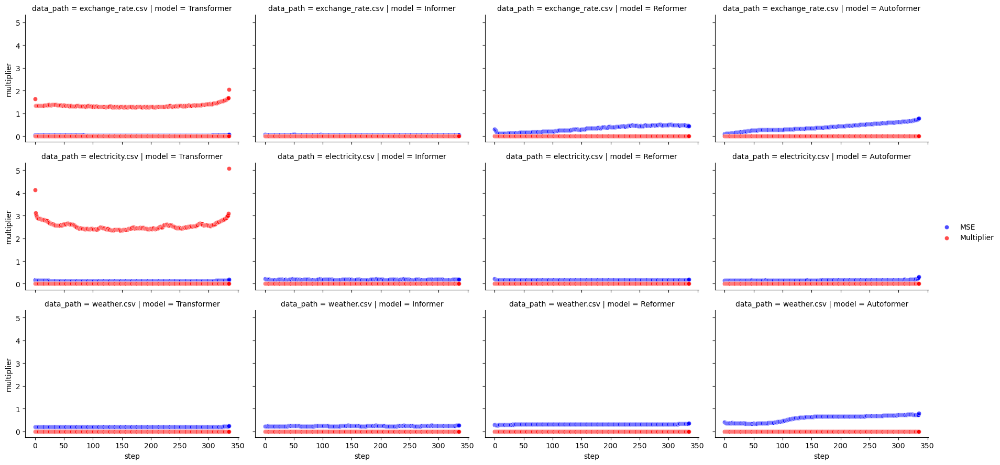

#### **Multipliers vs loss 720 (split=train, constraint_idx=2)**

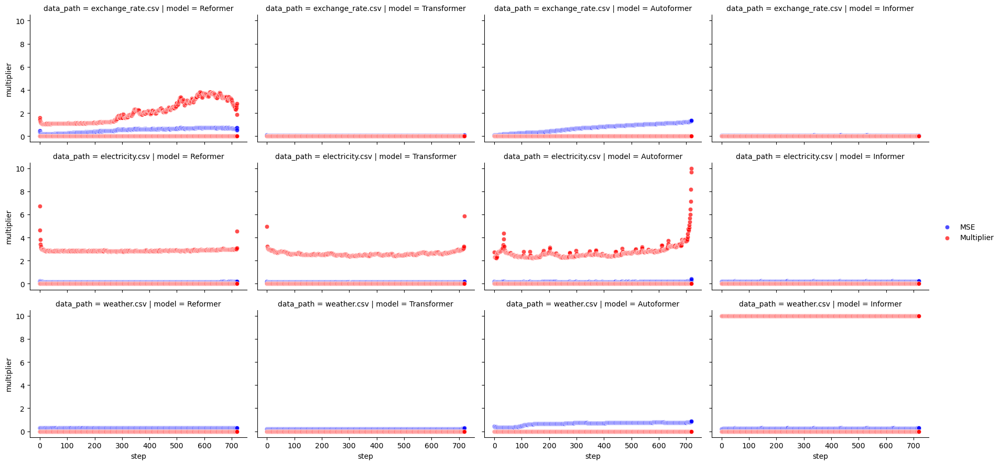

In [ ]:
# PARAMS
split="train"
constraint_idx = 2 # use the 50 percentile constraint to plot 1=25,2=50,3=75
seed=2021

# Filter
df_pct50 = df_to_plot[
    (df_to_plot.constraint_idx.isin([0,constraint_idx])) 
    & (df_to_plot.seed==seed) & (df_to_plot.split==split)
    & (df_to_plot.constraint_type=="constant")
    ].copy()

PRED_LENS=sorted(df_to_plot.pred_len.unique().tolist())
#PRED_LENS=[96]
for pred_len in PRED_LENS:
    # Add data for constant line
    df_current_plot = df_pct50.query('pred_len==@pred_len').copy()
    #constraint_level = df_current_plot.constraint_level.unique()[0]
    #df_current_plot['constraint_level'] = constraint_level
    display(Markdown(f"#### **Multipliers vs loss {pred_len} (split={split}, constraint_idx={constraint_idx})**"))

    g = sns.FacetGrid(df_current_plot, col='model', row='data_path', height=3, aspect=1.5, legend_out=True)
    # Plot multipliers and MSEs
    g.map(sns.scatterplot, "step", "mse", alpha=.7,color='blue',label='MSE')
    g.map(sns.scatterplot, "step", "multiplier", alpha=.7,color='red',label='Multiplier')
    # Add legend the series

    g.add_legend()
    #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{pred_len}_{str(constraint_level).replace('.','')}.png")
    plt.show()

### Does shape prevail when extending window length

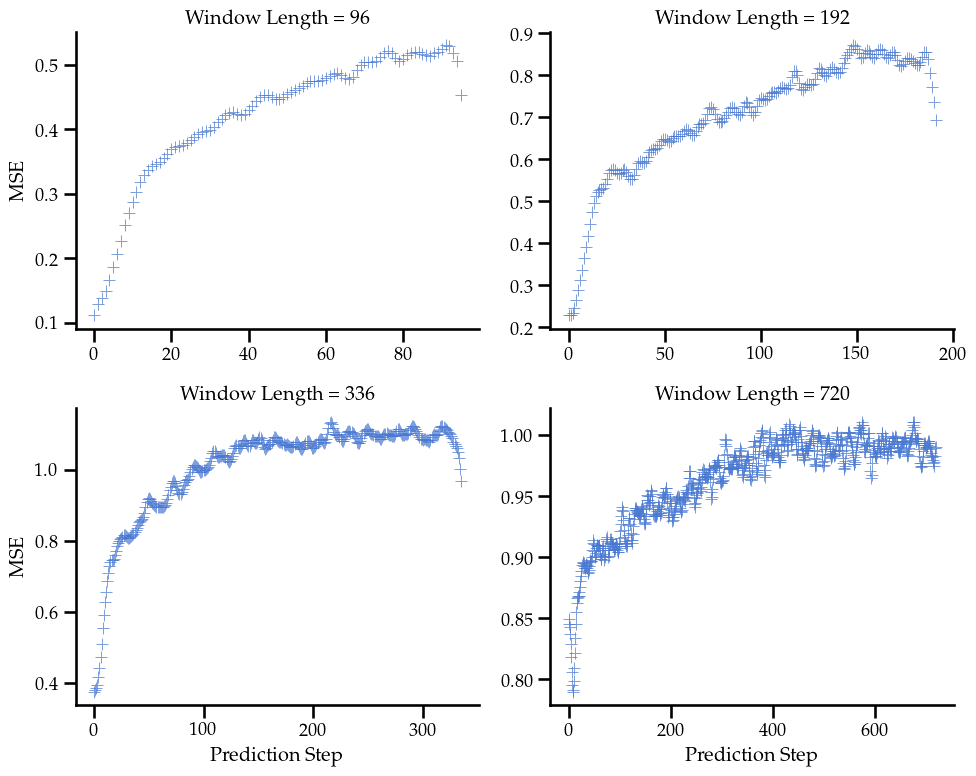

In [197]:
model="Reformer"
data_path="weather.csv"
pred_len=720
split='test'

#seaborn params
plt.rcParams['lines.linewidth'] = 1.8
sns.set_context("talk", font_scale=0.8)
backup = plt.rcParams
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})
#sns.set_palette(sns.cubehelix_palette())
#sns.set_palette("tab10")
sns.set_palette("muted")
#sns.set_palette("Greys")

# Filter data
#to_plot = df_to_plot.query('model==@model & data_path==@data_path & split==@split & constraint_type=="erm"').copy()
# for model in df_to_plot.model.unique():
#     for data_path in df_to_plot.data_path.unique():
#         #for pred_len in df_to_plot.pred_len.unique():
#         to_plot = df_to_plot.query('model==@model & data_path==@data_path & split==@split & constraint_type=="erm"').copy()
#         #to_plot.loc[to_plot.constraint_level==-1.0,'constraint_level'] = to_plot.constraint_level.max()

#         to_plot.rename(columns={'mse':'MSE','step': "Prediction Step","pred_len":"Window Length"},inplace=True)
#         #display(to_plot.constraint_level)
#         # g = sns.scatterplot(data=to_plot,
#         #                     x="Prediction Step",
#         #                     y= "MSE",
#         #                     alpha=.7,hue='constraint_type',style='constraint_type',
#         #                     #palette={'ERM':'blue','Constrained':'red'},
#         #                     legend='full'
#         #                     )
#         display(Markdown(f"# {model} on {data_path} (pred_len={pred_len}, split={split})"))
#         g=sns.FacetGrid(to_plot, col="Window Length", col_wrap=2, height=4, aspect=1.5,sharex=False,sharey=False).map(sns.scatterplot, "Prediction Step", "MSE", alpha=.7)
#         g.map(sns.scatterplot, "Prediction Step", "MSE", alpha=.7)
#         #g.set_title(f"{model} on {data_path} (pred_len={pred_len}, split={split})")
#         plt.figure(figsize=(3.5, 2.6))
#         plt.show()
to_plot = df_to_plot.query('model==@model & data_path==@data_path & split==@split & type=="ERM"').copy()
#display(to_plot.run_id.nunique())
#to_plot.loc[to_plot.constraint_level==-1.0,'constraint_level'] = to_plot.constraint_level.max()

# to_plot.rename(columns={'mse':'MSE','step': "Prediction Step","pred_len":"Window Length"},inplace=True)
#display(to_plot.constraint_level)
# g = sns.scatterplot(data=to_plot,
#                     x="Prediction Step",
#                     y= "MSE",
#                     alpha=.9,hue='Window Length',style='Window Length',
#                     #palette={'ERM':'blue','Constrained':'red'},
#                     legend='full'
#                     )
#g.set_title(f"{model} on {data_path} (pred_len={pred_len}, split={split})")
#g.set_title("")
#plt.figure(figsize=(3.5, 2.6))  # Width, height in inches (standard on papers according to chatGPT)

#plt.savefig(f'../figures/icml/shape_across_lengths_{model}_{data_path[:4]}.pdf', bbox_inches='tight')  # For a PGF file

# Another option
to_plot.rename(columns={'mse':'MSE','step': "Prediction Step","pred_len":"Window Length"},inplace=True)
g=sns.FacetGrid(to_plot, 
                col="Window Length", 
                col_wrap=2, 
                height=4, 
                aspect=1.25,
                sharex=False,
                sharey=False
                )
g.map(sns.scatterplot, "Prediction Step", "MSE", alpha=.7,marker='+')
plt.savefig(f'../figures/icml/shape_across_lengths_{model}_{data_path[:4]}.pdf', bbox_inches='tight')
# g = sns.scatterplot(data=to_plot,
#                     x="Prediction Step",
#                     y= "MSE", 
#                     alpha=.7,hue='Window Length',style='Window Length',
#                     #palette={'ERM':'blue','Constrained':'red'},
#                     legend='full')

plt.rcParams.update(backup)
#g2 = sns.lineplot(data=to_plot.query("constraint_type=='constant'"),x="Prediction Step",y= "constraint_level", alpha=.7,color='green',label='Constraint Level')

### Is train correlated with test?

<AxesSubplot:xlabel='mse_train', ylabel='mse_test'>

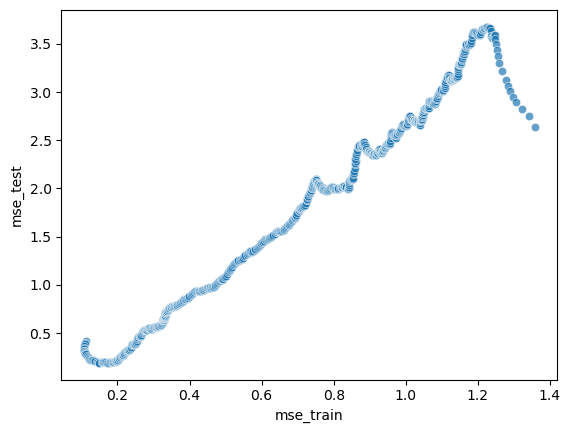

In [ ]:
model="Autoformer"
data_path="exchange_rate.csv"
pred_len=720

dd=df_to_plot.query('model==@model & data_path==@data_path & type=="ERM" & pred_len==@pred_len')
# Create a dataset of mse train and mse test for each step with dd using melt
dd_train = dd.query('split=="train"').copy()
dd_test = dd.query('split=="test"').copy()

dd_plot=dd_train.merge(dd_test,on="step",suffixes=('_train','_test'))[['step','mse_train','mse_test']]
#dd2['diff'] = dd2.test-dd2.train

sns.scatterplot(dd_plot, x="mse_train", y="mse_test", alpha=.7,)

### PAPER: Singular ERM vs Constrained 
Of ERM vs constrained

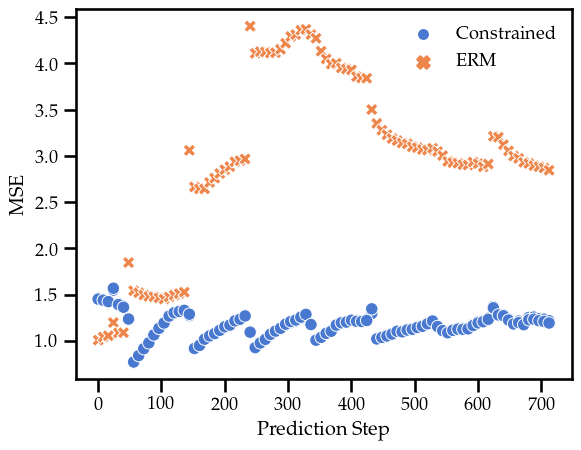

In [ ]:
# #Option 1
# model="Autoformer"
# data_path="exchange_rate.csv"
# pred_len=336
# split='test'

# # Option 2
# model="Transformer"
# data_path="exchange_rate.csv"
# pred_len=720
# split='test'

# # Option 3
model="Informer"
data_path="exchange_rate.csv"
pred_len=720
split='test'

# # Option 4
# model="Autoformer"
# data_path="weather.csv"
# pred_len=96
# split='test'

#seaborn params
plt.rcParams['lines.linewidth'] = 1.8
#sns.set_context("talk", font_scale=0.8)
backup = plt.rcParams
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})

#sns.set_palette(sns.cubehelix_palette())
#sns.set_palette("tab10")
sns.set_palette("muted")
#sns.set_palette("Greys")

# Filter data
to_plot = df_to_plot.query('model==@model & data_path==@data_path & pred_len==@pred_len & split==@split').copy()
to_plot.loc[to_plot.constraint_level==-1.0,'constraint_level'] = to_plot.constraint_level.max()

#Sample every other datapoint
to_plot = to_plot[to_plot.step%8==0]

to_plot.rename(columns={'mse':'MSE','step': "Prediction Step"},inplace=True)
#display(to_plot.constraint_level)
g = sns.scatterplot(data=to_plot,
                    x="Prediction Step",
                    y= "MSE", 
                    hue='type',
                    style='type',
                    #marker='+',
                    #palette={'ERM':'blue','Constrained':'red'},
                    legend='full'
                    )
#g.set_title(f"{model} on {data_path} (pred_len={pred_len}, split={split})")
#plt.figure(figsize=(3.5, 2.6))  # Width, height in inches (standard on papers according to chatGPT)

# remove borders from legend
g.get_legend().get_frame().set_linewidth(0.0)
g.get_legend().set_title("")

# Set the size of the markers
g.legend_.legendHandles[0]._sizes = [40]

# make legend marker a + instead of a dot using handlers manually
#g.legend(handles=g.legend_.legendHandles, labels=["ERM", "Constrained"], title="Type", loc="upper left")



#g.set_xlabels("")
#g.set_ylabels("")
#g.set_titles(col_template="{col_name}")
#g.fig.supxlabel("Prediction Step")
#g.fig.supylabel("MSE")
# for ax in g.axes.flat:
#     ax.set_title("", fontsize='large')
#     ax.set_xlabel(ax.get_xlabel(), fontsize='large')
#     ax.set_ylabel(ax.get_ylabel(), fontsize='large')

# make markers bigger
# for ax in g.axes.flat:
#     for p in ax.patches:
#         p.set( markersize=20)
# disable legend
#g._legend.remove()
# tight layout
#g.tight_layout()
#g.savefig(f"../figures/icml/{figname}.pdf")


plt.savefig(f'../figures/icml/erm_vs_constrained_fp_{model}_{data_path[:4]}_{pred_len}.pdf', bbox_inches='tight')  # For a PGF file
#plt.show()
plt.rcParams.update(backup)
#g2 = sns.lineplot(data=to_plot.query("constraint_type=='constant'"),x="Prediction Step",y= "constraint_level", alpha=.7,color='green',label='Constraint Level')

### PAPER: ERM vs Constrained across models on two datasets

Saved to ../figures/icml/constrained_vs_erm_allmodels_exch_720.pdf
Saved to ../figures/icml/constrained_vs_erm_allmodels_weather_96.pdf


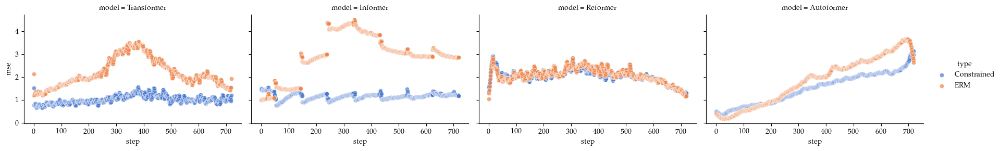

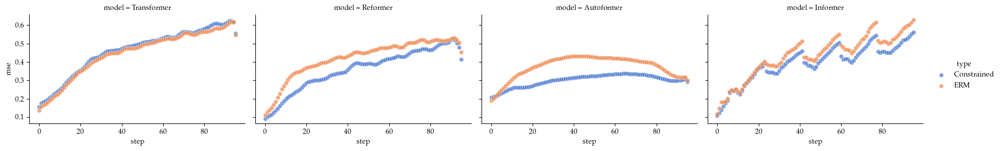

In [ ]:
df_set1 = df_to_plot.query('data_path=="exchange_rate.csv" and pred_len==720 and split=="test"').copy()
df_set2 = df_to_plot.query('data_path=="weather.csv" and pred_len==96 and split=="test"').copy()

#Params for latex
backup = plt.rcParams
sns.set_palette("muted")
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
}
)

#plot 1
g=sns.FacetGrid(df_set1, col='model', hue='type', height=3, aspect=1.5, legend_out=True)
g.map(sns.scatterplot, "step", "mse", alpha=.7,legend='full')
g.add_legend()
#TODO fix and uncomment
figure1_dir = f"{FIGURES_FOLDER}/constrained_vs_erm_allmodels_exch_720.pdf"
print(f"Saved to {figure1_dir}")
g.savefig(figure1_dir)

#plot 2
g=sns.FacetGrid(df_set2, col='model', hue='type', height=3, aspect=1.5, legend_out=True)
g.map(sns.scatterplot, "step", "mse", alpha=.7)
g.add_legend()
#TODO fix and uncomment
figure1_dir = f"{FIGURES_FOLDER}/constrained_vs_erm_allmodels_weather_96.pdf"
print(f"Saved to {figure1_dir}")
g.savefig(figure1_dir)

#restoring parameters
plt.rcParams.update(backup)

### (old) ERM vs constrained

[3 2 1 0]


### Dataset: electricity.csv pred_len: 96 constraint_idx: 3

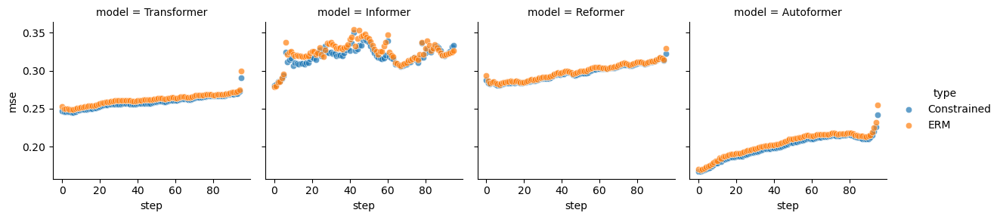

### Dataset: electricity.csv pred_len: 96 constraint_idx: 2

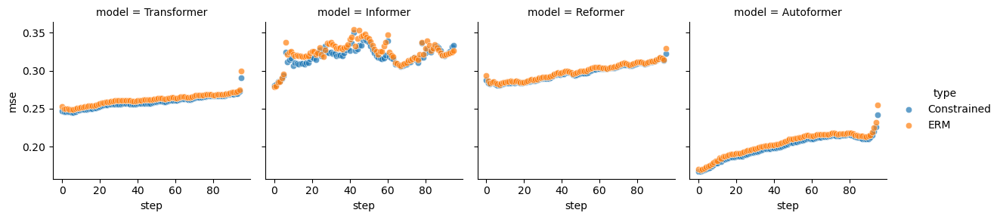

### Dataset: electricity.csv pred_len: 96 constraint_idx: 1

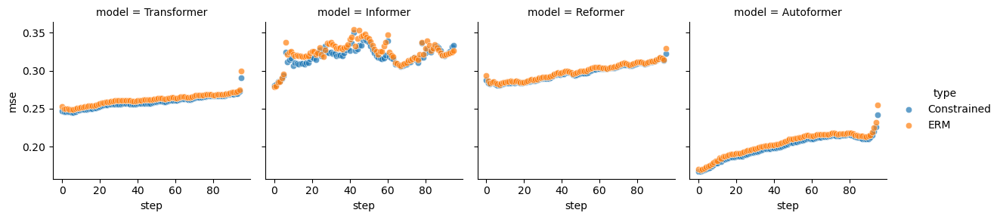

### Dataset: electricity.csv pred_len: 96 constraint_idx: 0

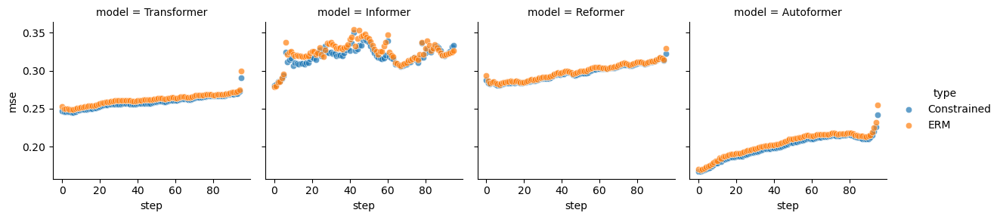

[5 6 2 1 0]


### Dataset: electricity.csv pred_len: 192 constraint_idx: 5

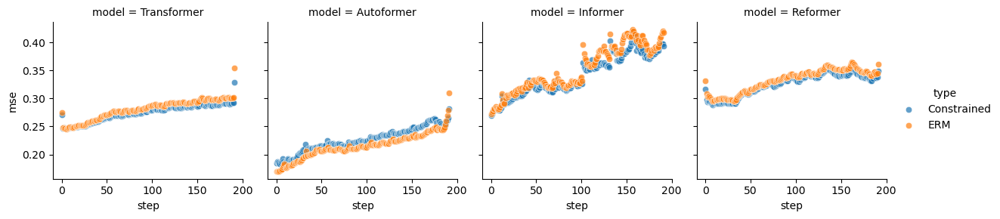

### Dataset: electricity.csv pred_len: 192 constraint_idx: 6

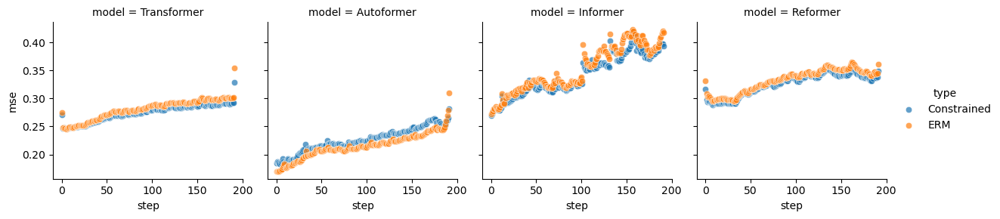

### Dataset: electricity.csv pred_len: 192 constraint_idx: 2

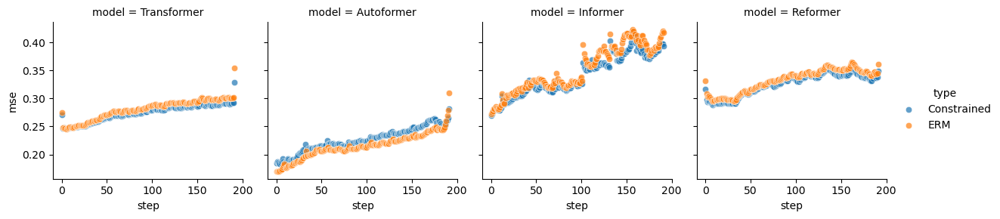

### Dataset: electricity.csv pred_len: 192 constraint_idx: 1

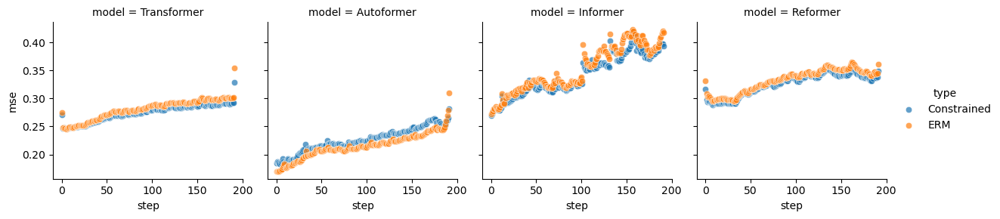

### Dataset: electricity.csv pred_len: 192 constraint_idx: 0

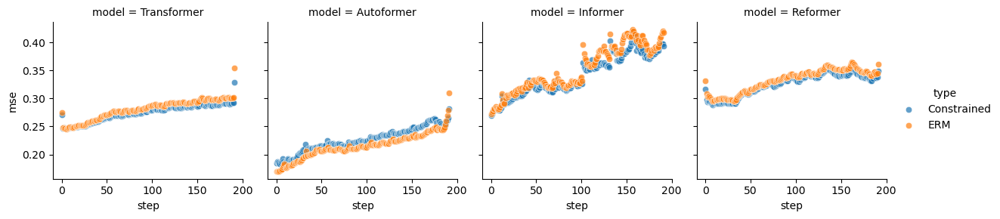

[5 2 3 0]


### Dataset: electricity.csv pred_len: 336 constraint_idx: 5

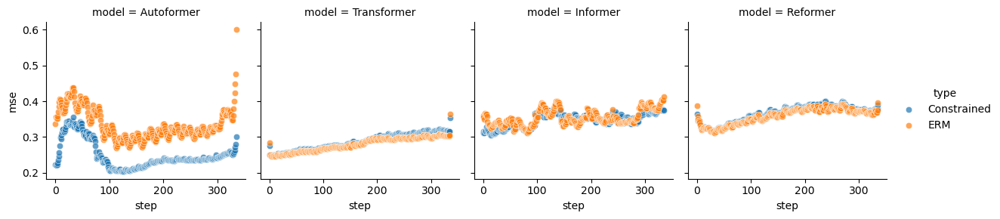

### Dataset: electricity.csv pred_len: 336 constraint_idx: 2

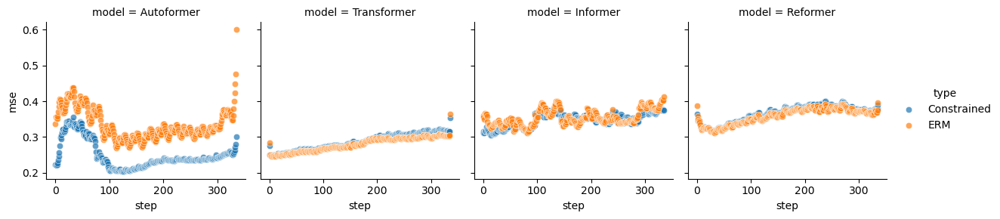

### Dataset: electricity.csv pred_len: 336 constraint_idx: 3

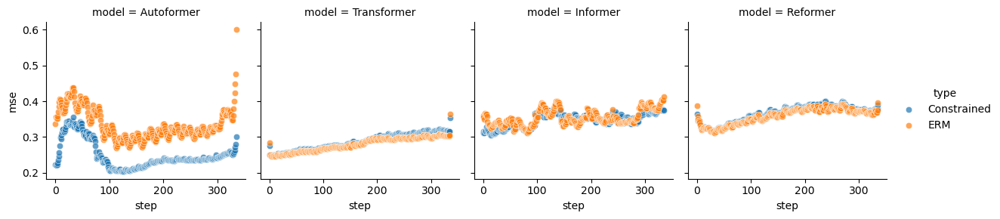

### Dataset: electricity.csv pred_len: 336 constraint_idx: 0

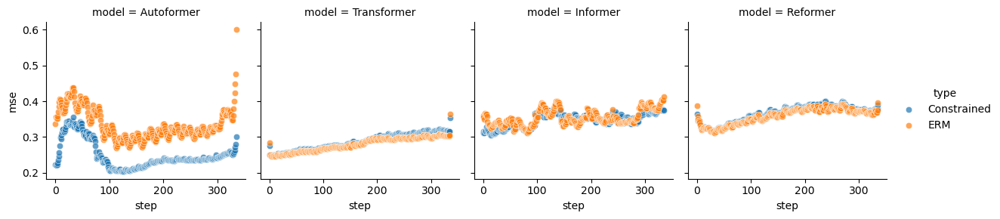

[2 3 0]


### Dataset: electricity.csv pred_len: 720 constraint_idx: 2

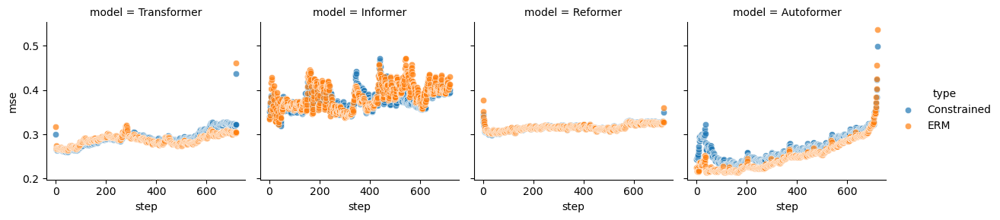

### Dataset: electricity.csv pred_len: 720 constraint_idx: 3

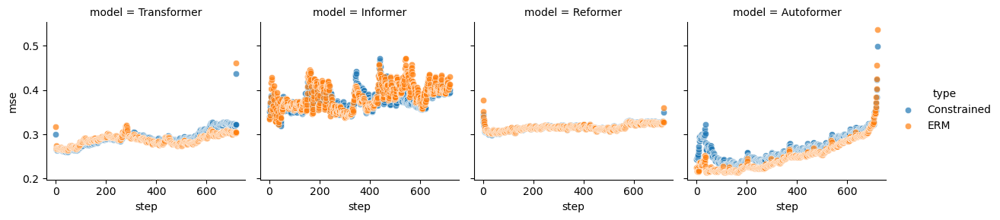

### Dataset: electricity.csv pred_len: 720 constraint_idx: 0

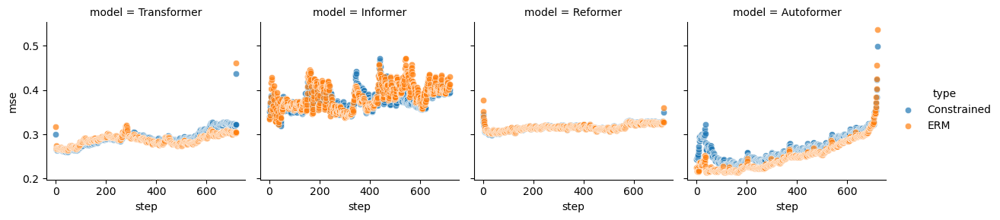

[6 2 4 0]


### Dataset: exchange_rate.csv pred_len: 96 constraint_idx: 6

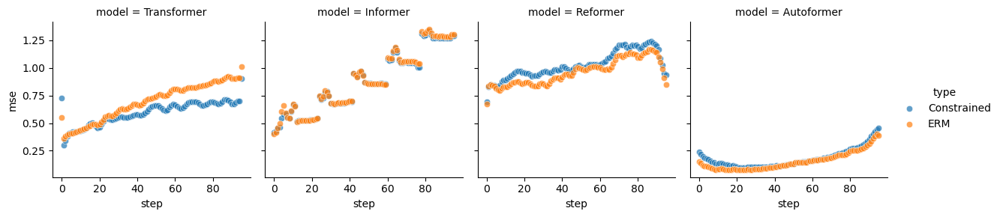

### Dataset: exchange_rate.csv pred_len: 96 constraint_idx: 2

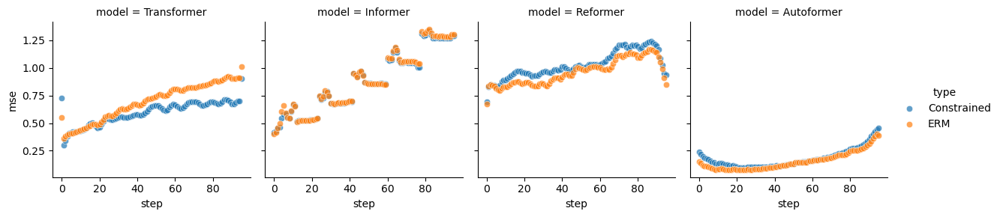

### Dataset: exchange_rate.csv pred_len: 96 constraint_idx: 4

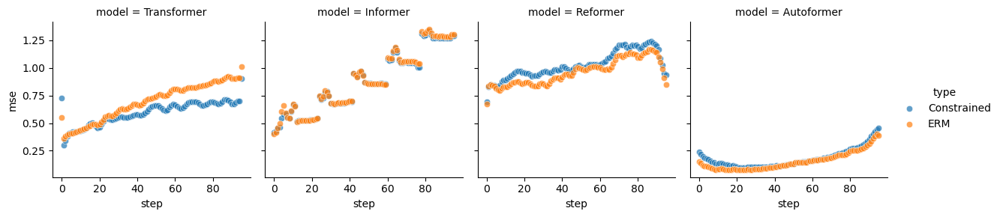

### Dataset: exchange_rate.csv pred_len: 96 constraint_idx: 0

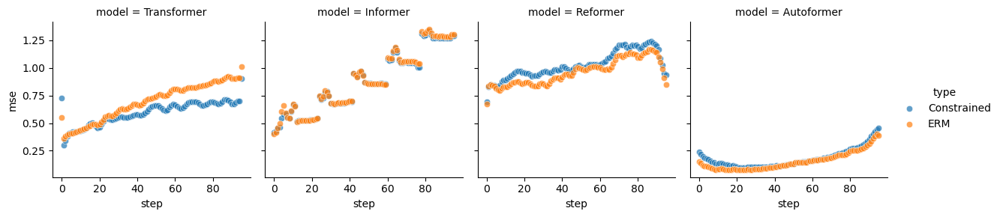

[6 3 2 0]


### Dataset: exchange_rate.csv pred_len: 192 constraint_idx: 6

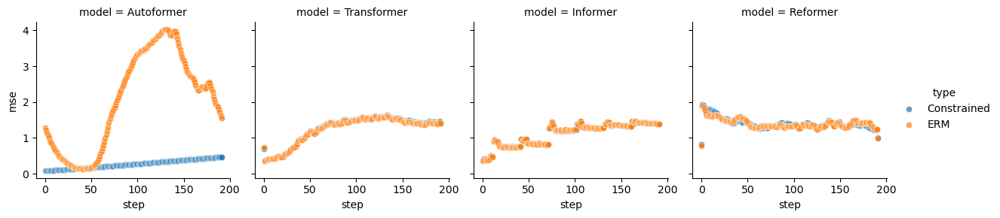

### Dataset: exchange_rate.csv pred_len: 192 constraint_idx: 3

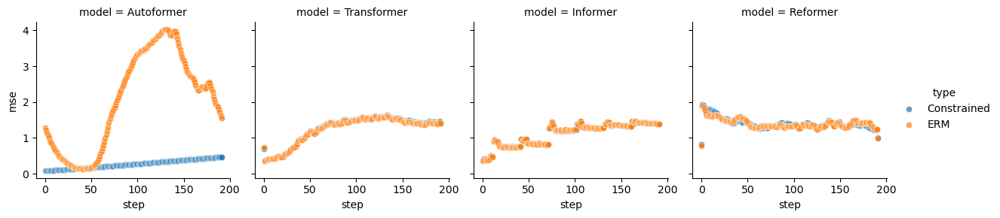

### Dataset: exchange_rate.csv pred_len: 192 constraint_idx: 2

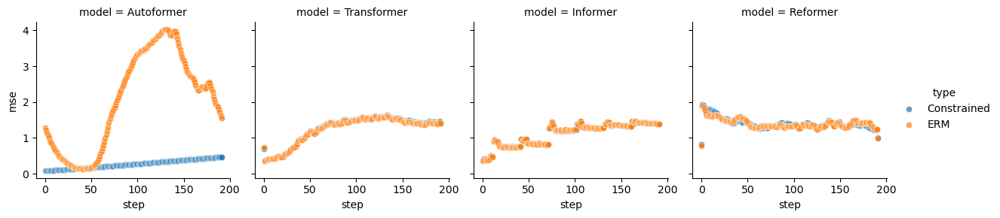

### Dataset: exchange_rate.csv pred_len: 192 constraint_idx: 0

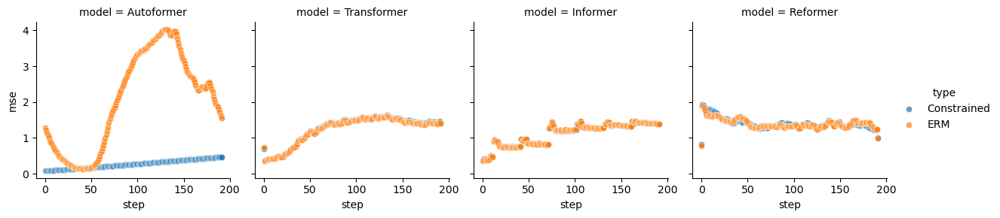

[6 2 1 0]


### Dataset: exchange_rate.csv pred_len: 336 constraint_idx: 6

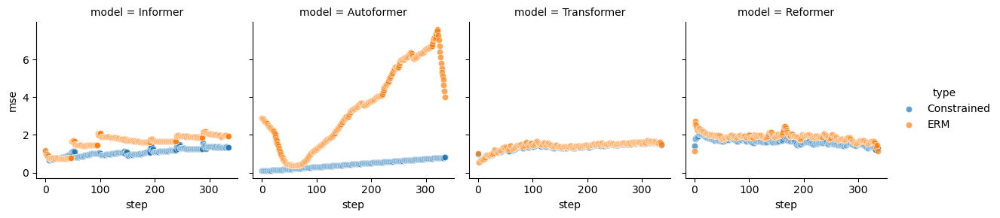

### Dataset: exchange_rate.csv pred_len: 336 constraint_idx: 2

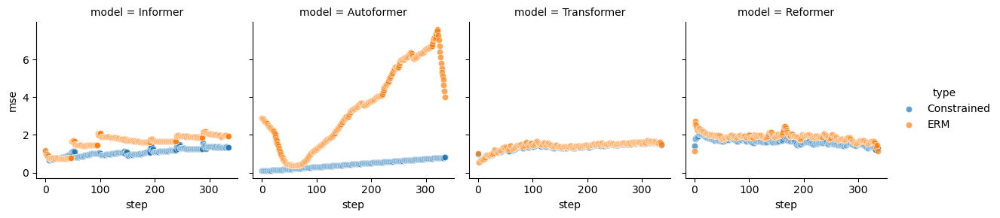

### Dataset: exchange_rate.csv pred_len: 336 constraint_idx: 1

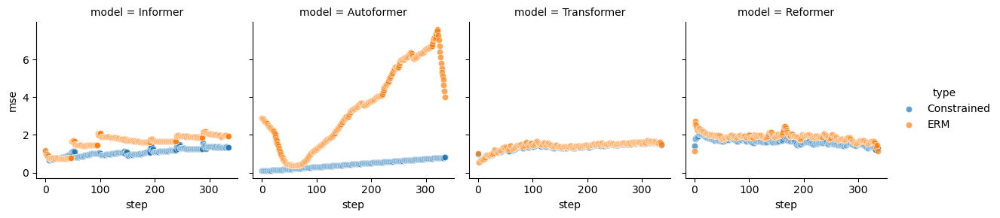

### Dataset: exchange_rate.csv pred_len: 336 constraint_idx: 0

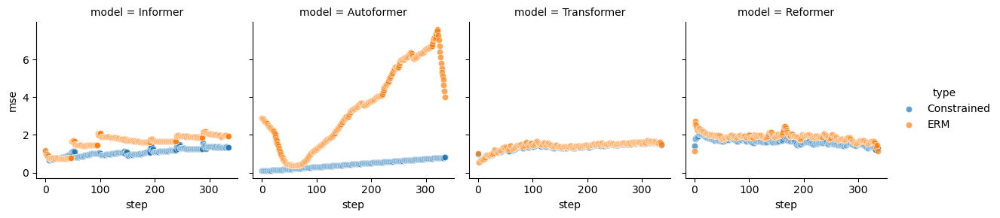

[5 2 3 0]


### Dataset: exchange_rate.csv pred_len: 720 constraint_idx: 5

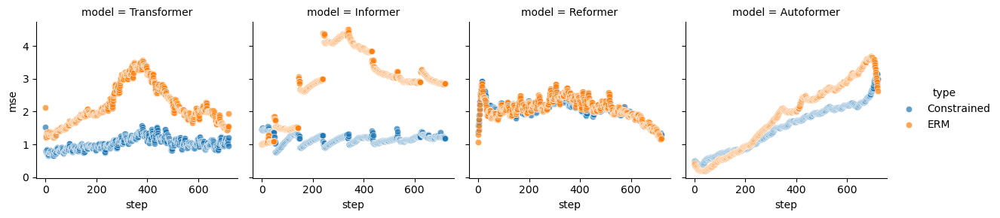

### Dataset: exchange_rate.csv pred_len: 720 constraint_idx: 2

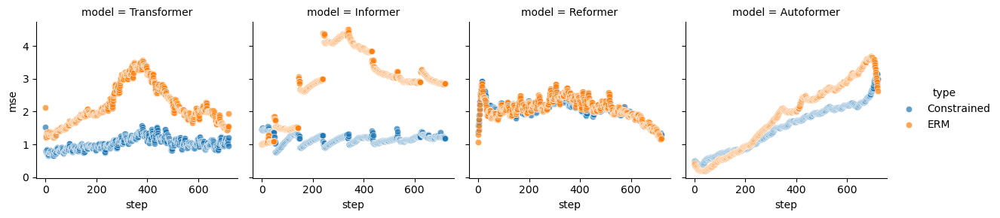

### Dataset: exchange_rate.csv pred_len: 720 constraint_idx: 3

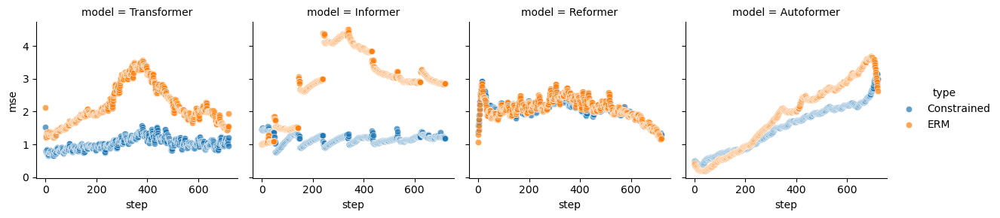

### Dataset: exchange_rate.csv pred_len: 720 constraint_idx: 0

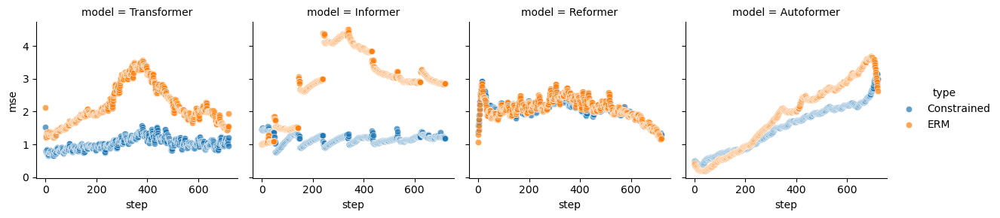

[4 6 1 0]


### Dataset: weather.csv pred_len: 96 constraint_idx: 4

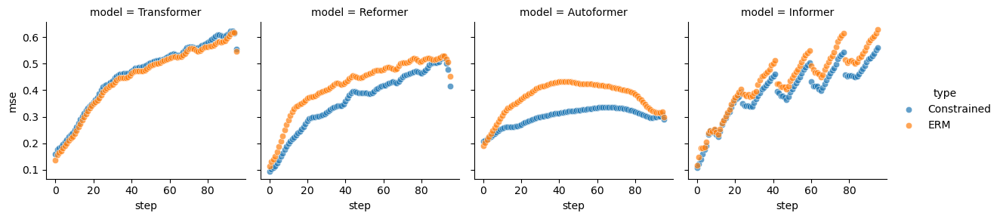

### Dataset: weather.csv pred_len: 96 constraint_idx: 6

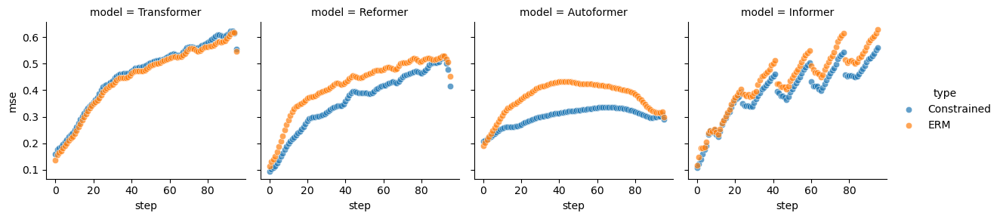

### Dataset: weather.csv pred_len: 96 constraint_idx: 1

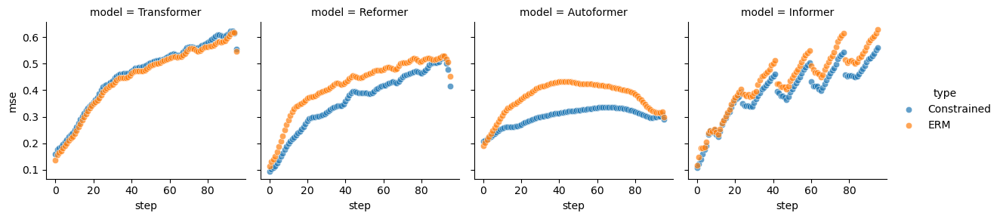

### Dataset: weather.csv pred_len: 96 constraint_idx: 0

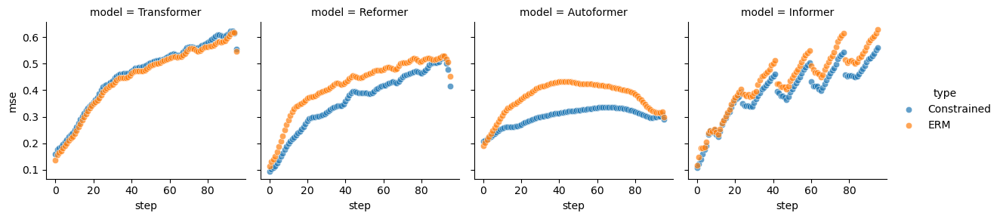

[5 4 2 1 0]


### Dataset: weather.csv pred_len: 192 constraint_idx: 5

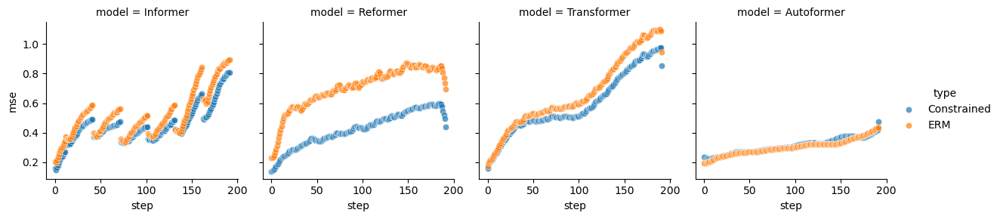

### Dataset: weather.csv pred_len: 192 constraint_idx: 4

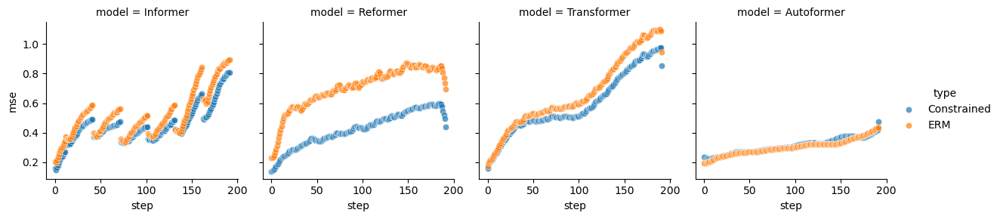

### Dataset: weather.csv pred_len: 192 constraint_idx: 2

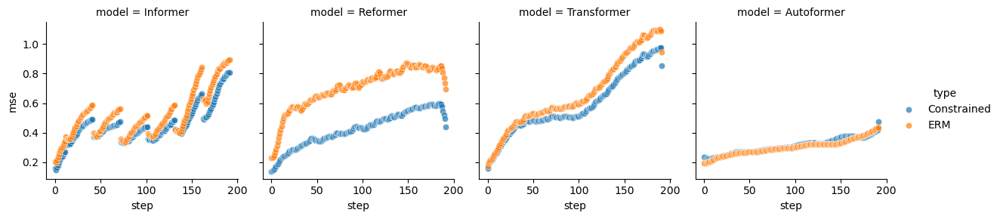

### Dataset: weather.csv pred_len: 192 constraint_idx: 1

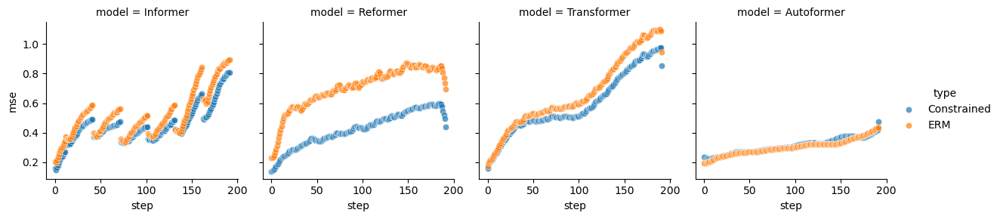

### Dataset: weather.csv pred_len: 192 constraint_idx: 0

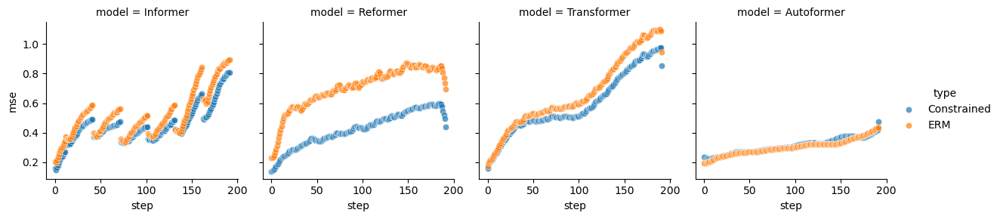

[5 4 3 1 0]


### Dataset: weather.csv pred_len: 336 constraint_idx: 5

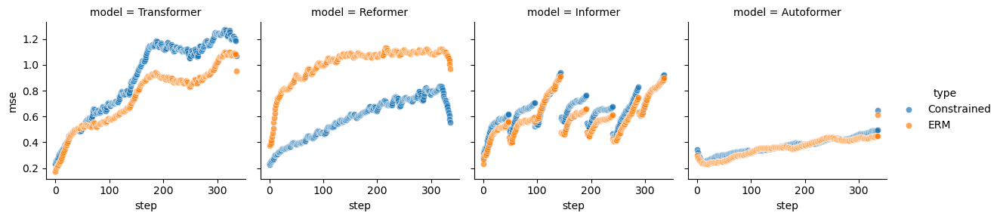

### Dataset: weather.csv pred_len: 336 constraint_idx: 4

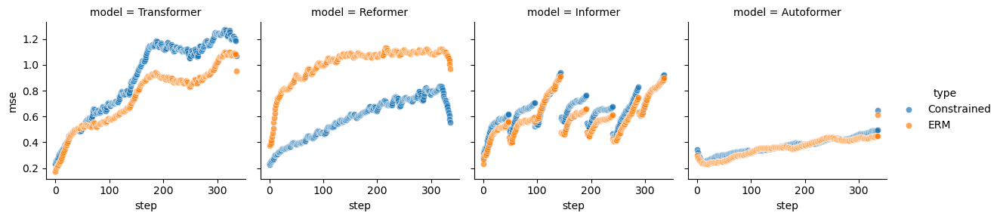

### Dataset: weather.csv pred_len: 336 constraint_idx: 3

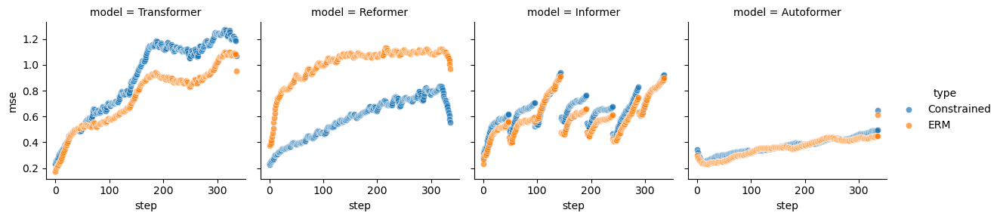

### Dataset: weather.csv pred_len: 336 constraint_idx: 1

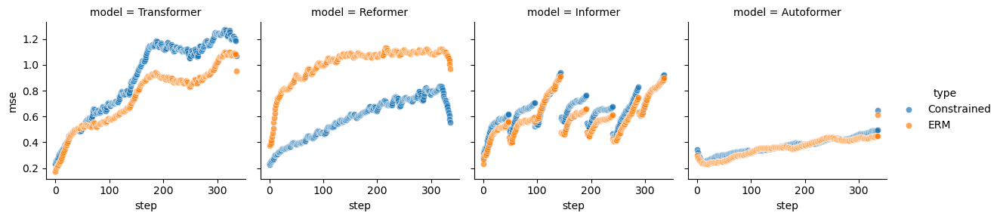

### Dataset: weather.csv pred_len: 336 constraint_idx: 0

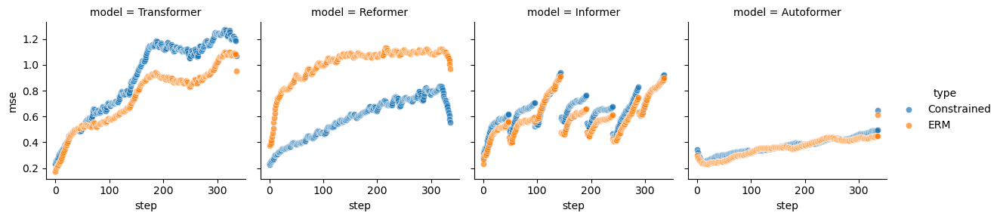

[3 2 1 0]


### Dataset: weather.csv pred_len: 720 constraint_idx: 3

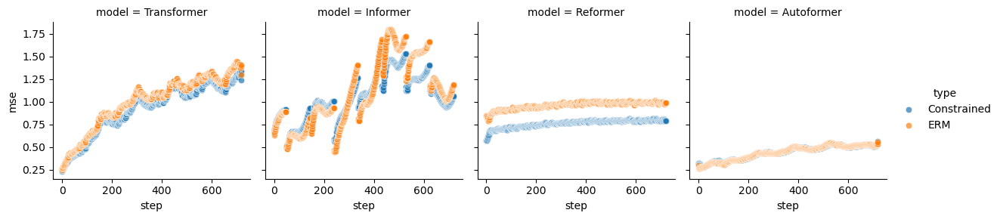

### Dataset: weather.csv pred_len: 720 constraint_idx: 2

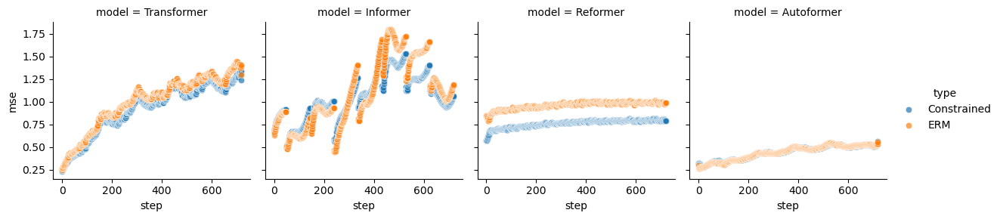

### Dataset: weather.csv pred_len: 720 constraint_idx: 1

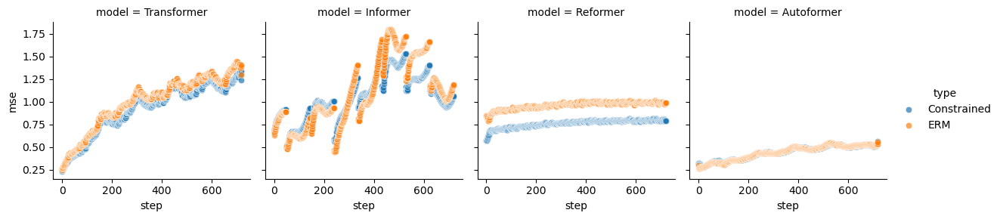

### Dataset: weather.csv pred_len: 720 constraint_idx: 0

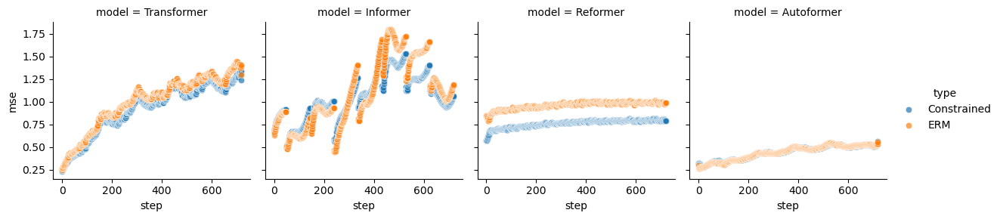

In [ ]:
from IPython.display import display, Markdown
to_plot = df_to_plot[(df_to_plot.split=='test')].copy()
for (data_path,pred_len), series in to_plot.groupby(['data_path',"pred_len"]):
    constraints = series.constraint_idx.unique()
    print(constraints)
    constraints = constraints[constraints!=-1] # to iterate over all constraints explored.
    for constraint_idx in constraints:
        display(Markdown(f"### Dataset: {data_path} pred_len: {pred_len} constraint_idx: {constraint_idx}"))
        plot_series = series#series[series["constraint_idx"]==constraint_idx]
        
        #means_per_experiment = plot_series.groupby(['pred_len','constraint_level','Algorithm','model','epoch','type'])['mse'].mean().reset_index()
        #display(means_per_experiment)
        # do a pivot where model are the rows, and the columns constrained and unconstrained
        #display(means_per_experiment.pivot(index=['model'], columns='type', values='mse').reset_index())

        # sns.scatterplot(x="step", y="mse", hue="Algorithm",style="split", data=plot_series)
        
        # plt.axhline(y=constraint_level, color='r', linestyle='-')
        # plt.title(f"Pred Length: {pred_len}, Constraint_level: {constraint_level}")
        # plt.show()

        # This same scatterplot but in a grid by algorithm. 
        g = sns.FacetGrid(plot_series, col="model", hue="type")
        g.map(sns.scatterplot, "step", "mse", alpha=.7)
        g.add_legend()
        # add the hline
        # for ax in g.axes:
        #     ax.axhline(y=constraint_level, color='r', linestyle='-')
        plt.show()
        # export this plot to latex. Remove the dot in constraint_level decimal
        #TODO fix
        #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{data_path.replace('.','')}_{pred_len}_{str(constraint_level).replace('.','')}.png")
        # Fix [Errno 2] No such file or directory: 'figures/electricity.csv_96_0.17_individual.png'


### ERM on multiple algorithms
As a front page chart to illustrate the problem

In [ ]:
#TODO ( I think Nacho already did this)

### Loss shaping single instance qualitative analysis

### Plotting dual variables

In [ ]:
df_to_plot[['run_id','pred_len','constraint_level','data_path','model','type']].drop_duplicates().query("data_path=='weather.csv' and model=='Reformer' and type=='Constrained'")

,run_id,pred_len,constraint_level,data_path,model,type
131904,ja5qqrwj,336,0.730,weather.csv,Reformer,Constrained
134064,dv2s5qjf,192,0.598,weather.csv,Reformer,Constrained
134928,dpn9jz5a,96,0.527,weather.csv,Reformer,Constrained
258768,dthgwiaz,720,0.283,weather.csv,Reformer,Constrained


In [ ]:
# #df_to_plot.query('split=="train" and pred_len==96').run_id.head(1)
# #mult_cols = [f"multiplier/{i}" for i in range(0,96)]
# # Plot for every constraint level in the 96 pred len window
# #for pred_len in df_to_plot.pred_len.unique():
# display(Markdown(f"# Multipliers for window of {pred_len}"))
# # sns.scatterplot(x="step", y="multiplier", hue="model",style="constraint_level", 
# #     data=df_to_plot.query(f"split=='train' and type=='Constrained' and pred_len=={96} and data_path=='weather.csv'"))
# # same plot, but grid with one plot per model
# dd = df_to_plot#df_to_plot.query("run_id=='6fgam2dx' and split=='train'")#.query(f"split=='train' and type=='Constrained' and pred_len==96 and data_path=='electricity.csv' and model=='Reformer' and constraint_level==0.157")
# dd_test = df_to_plot#df_to_plot.query("run_id=='6fgam2dx' and split=='test'")#.query(f"split=='test' and type=='Constrained' and pred_len==96 and data_path=='electricity.csv' and model=='Reformer' and constraint_level==0.157")

# #print(dd_test.constraint_level.unique())
# test_set_plus_multipliers = dd[['step','multiplier']].merge(dd_test[['step','split','mse']],on='step')

# unioned = pd.concat([dd[['step','split','multiplier','mse']],test_set_plus_multipliers[['step','split','multiplier','mse']]])

# display(unioned)


# display(test_set_plus_multipliers)

# #constraint_level==0.553
# # mult on x, mse@train and mse@test on y. hue=split
# # Add step over every point
# sns.scatterplot(unioned,x="multiplier", y="mse",hue='split', alpha=.3,legend='full')



# g = sns.FacetGrid(dd, col="model", row="constraint_level")
# g.map(sns.scatterplot, "step", "multiplier", alpha=.3)
# #g.map(sns.scatterplot, "step", "mse", alpha=.3)

# Multipliers for window of 720

,step,split,multiplier,mse
16128,0,train,2.801533,0.209369
16129,1,train,1.050123,0.204042
16130,2,train,0.269966,0.194581
16131,3,train,0.000000,0.189056
16132,4,train,0.000000,0.187635
...,...,...,...,...
17418235,719,test,NaN,1.910884
17418236,719,test,NaN,1.910884
17418237,719,val,NaN,1.909591
17418238,719,val,NaN,1.909591


,step,multiplier,split,mse
0,0,2.801533,train,0.209369
1,0,2.801533,test,0.268508
2,0,2.801533,val,0.266284
3,0,2.801533,train,0.215619
4,0,2.801533,test,0.247226
...,...,...,...,...
17418235,719,NaN,test,1.910884
17418236,719,NaN,test,1.910884
17418237,719,NaN,val,1.909591
17418238,719,NaN,val,1.909591


Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x7fedbc19fa70> (for post_execute):


KeyboardInterrupt: 

/home/jporras/miniconda3/envs/autoformer/lib/python3.7/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


Error in callback <function flush_figures at 0x7fedbc19f4d0> (for post_execute):


KeyboardInterrupt: 

### More random explorations
Ideas: 
1. Loss over time
2. Infeasibility rate over time
3. Loss shape across epochs (see how it evolves)
4. Plotting dual variables

## Result tables
1. Reproduce the pivot table from notebook 11, perhaps add standard deviation reports.
2. Explore and find other interesting table visualziation

### Pivot tables (summary)

In [ ]:
def style_pivot_table_best_per_params(pivoted_df):
    pivoted_df=pivoted_df.copy()
    pivoted_df.columns.names = ['metric','constraint_type','model']
    mask = pd.DataFrame(False, index=pivoted_df.index, columns=pivoted_df.columns)
    for keys,subset in  pivoted_df.groupby(level=['metric','model'],axis=1):
        mask.loc[:,subset.columns] = subset.eq(subset.min(axis=1), axis=0)
        
    ##STYLE
    # truncate to 4 decimals for display
    pivoted_df=pivoted_df.style.format("{:.3f}")
    pivoted_df=pivoted_df.apply(lambda s: ['font-weight: bold;text-decoration: underline' if v else '' for v in mask.loc[s.name]], axis=1)
    return pivoted_df

def data_path_renaming(x):
    if x=="exchange_rate.csv":
        x='Exchange'
    x=x.replace(".csv","")
    if x=="electricity":
        x="ECL"
    else: 
        x=x.replace(".csv","").replace("_"," ").title()
    return latex_scaffolding_dataset(x)
def latex_scaffolding_dataset(x):
    # Add rotatebox
    x=r'\rotatebox'+'{90}{'+x+'}'
    x=r'\multirow{4}{*}{'+x+'}'
    return x
def text_bf(x):
    return r'\textbf{'+str(x)+'}'

def latex_style_best(pivoted_df):
    pivoted_df=pivoted_df.copy()
    pivoted_df.columns.names = ['metric','constraint_type','model']
    mask = pd.DataFrame(False, index=pivoted_df.index, columns=pivoted_df.columns)
    for keys,subset in  pivoted_df.groupby(level=['metric','model'],axis=1):
        mask.loc[:,subset.columns] = subset.eq(subset.min(axis=1), axis=0)
    #if mask is true, add text_bf
    boldface_df = pivoted_df.copy().applymap(lambda x: f"{x:.3f}")
    boldface_df[mask] = boldface_df.applymap(text_bf)
    return boldface_df


pd.set_option('display.max_columns', None)
def compute_pivot_over_metric(summary_metrics,pivot_value_columns=['window_std'],split='test'):
    pivoted_tables=[]
    data_paths=summary_metrics.data_path.unique()
    for data_path in data_paths:
        tp2=summary_metrics.query(f'data_path==@data_path and split==@split').copy()

        #GROUPING TEH VALS
        grouped_values=tp2.groupby(['pred_len','model','constraint_type'])[[
            'mse',
            'mcv',
            'std_mse',
            'std_mcv',
            'mean_infeasible_rate',
            'std_infeasible_rate',
            'window_std'
            ]].mean().reset_index()
        
        # Pivot of models versus constrained and ERM, values are mse and mse_diff
        all_results = grouped_values
        
        # Pivot all results, sort ascending by pred_len, then mean_violation on constrained
        pivoted=all_results.pivot(
            index=['pred_len'],
            columns=['constraint_type','model'], 
            values=pivot_value_columns
        )
        
        pivoted=style_pivot_table_best_per_params(pivoted)
        #display(pivoted)
        pivoted_tables.append(pivoted)
    result_table = pd.concat([d.data for d in pivoted_tables],keys=data_paths,names=['data_path'])

    return result_table
display(Markdown(f"# Pivot tables for split=test"))


summary_metrics_to_plot = summary_metrics.copy()
# rename constraint_types to be more readable
summary_metrics_to_plot['constraint_type'] = summary_metrics_to_plot['constraint_type'].replace({
    'constant':'1Ours',
    'erm':'3ERM',
    'constant_resilience':'2Ours+R'
})

for metric in [
    'mcv',
    'mse',
    #'mean_infeasible_rate',
    #'window_std',
    ]:
    result_table = compute_pivot_over_metric(summary_metrics_to_plot,pivot_value_columns=[metric],split='test')
    display(Markdown(f"## {metric}"))
    # add bold
    display(style_pivot_table_best_per_params(result_table))
    #latex styling
    latex_table=result_table.copy()

    latex_table.index=latex_table.index \
        .set_levels([data_path_renaming(level) for level in latex_table.index.levels[0]],level=0)

    
    
    latex_table=latex_style_best(latex_table)
    
    # drop the metric level in the multiindex
    latex_table.columns=latex_table.columns.droplevel(0)

    # Swap the column multiindex to model on top
    latex_table=latex_table.swaplevel(0,1,axis=1)

    #latex_table=style_pivot_table_best_per_params(latex_table)
    # Show only :.4f
    # Rename data_path to None
    latex_table=latex_table.rename_axis(index={'data_path':None,'pred_len':''},columns={'model':'','constraint_type':''})
    #display(latex_table.columns)
    # refactor the multiindex in columns so that repeated models merge
    #print(latex_table.to_latex(escape=False,index_names=False,multicolumn_format='c',multicolumn=True))
    print(latex_table.to_latex(escape=False,multicolumn_format='c',multicolumn=True,column_format='cc|ccc|ccc|ccc|ccc'))
    


# Pivot tables for split=test

## mcv

\begin{tabular}{cc|ccc|ccc|ccc|ccc}
\toprule
                                         &     & \multicolumn{3}{c}{Autoformer} & \multicolumn{3}{c}{Informer} & \multicolumn{3}{c}{Reformer} & \multicolumn{3}{c}{Transformer} \\
                                         &     &           1Ours &         2Ours+R &            3ERM &           1Ours &         2Ours+R &            3ERM &           1Ours &         2Ours+R &            3ERM &           1Ours &         2Ours+R &            3ERM \\
{} & {} &                 &                 &                 &                 &                 &                 &                 &                 &                 &                 &                 &                 \\
\midrule
\multirow{4}{*}{\rotatebox{90}{ECL}} & 96  &  \textbf{0.087} &           0.109 &           0.091 &  \textbf{0.170} &           0.193 &           0.176 &  \textbf{0.147} &           0.152 &           0.149 &  \textbf{0.149} &           0.169 &           0.152 \\
            

## mse

\begin{tabular}{cc|ccc|ccc|ccc|ccc}
\toprule
                                         &     & \multicolumn{3}{c}{Autoformer} & \multicolumn{3}{c}{Informer} & \multicolumn{3}{c}{Reformer} & \multicolumn{3}{c}{Transformer} \\
                                         &     &           1Ours &         2Ours+R &            3ERM &           1Ours &         2Ours+R &            3ERM &           1Ours &         2Ours+R &            3ERM &           1Ours &         2Ours+R &            3ERM \\
{} & {} &                 &                 &                 &                 &                 &                 &                 &                 &                 &                 &                 &                 \\
\midrule
\multirow{4}{*}{\rotatebox{90}{ECL}} & 96  &  \textbf{0.200} &           0.220 &           0.204 &  \textbf{0.319} &           0.342 &           0.325 &  \textbf{0.297} &           0.303 &           0.299 &  \textbf{0.259} &           0.278 &           0.262 \\
            

In [ ]:
#latex styling
latex_table=result_table.data.copy()

latex_table.index=latex_table.index \
    .set_levels([data_path_renaming(level) for level in latex_table.index.levels[0]],level=0)

#TODO FIX the styling function to add textbf
#latex_table=latex_style_best(latex_table)
# drop the metric level in the multiindex
latex_table.columns=latex_table.columns.droplevel(0)

# Swap the column multiindex to model on top
latex_table=latex_table.swaplevel(0,1,axis=1)

#latex_table=style_pivot_table_best_per_params(latex_table)
# Show only :.4f
latex_table=latex_table.applymap(lambda x: f"{x:.4f}")
# Rename data_path to None
latex_table=latex_table.rename_axis(index={'data_path':None,'pred_len':''},columns={'model':'','type':''})
#display(latex_table.columns)
# refactor the multiindex in columns so that repeated models merge
display(latex_table)
#print(latex_table.to_latex(escape=False,index_names=False,multicolumn_format='c',multicolumn=True))
print(latex_table.to_latex(escape=False,multicolumn_format='c',multicolumn=True))


Autoformer            Informer  \
                                              Constrained     ERM Constrained   
                                                                                
\multirow{4}{*}{\rotatebox{90}{ECL}}      96       0.0872  1.2040      0.1704   
                                          192      0.0260  1.2153      0.1733   
                                          336      0.0422  1.3342      0.1585   
                                          720      0.0933  1.2521      0.1647   
\multirow{4}{*}{\rotatebox{90}{Exchange}} 96       0.0222  1.1546      0.8342   
                                          192      0.0000  3.0520      1.0680   
                                          336      0.0000  4.4415      0.0000   
                                          720      0.7780  2.8524      0.0000   
\multirow{4}{*}{\rotatebox{90}{Weather}}  96       0.0000  1.3749      0.1858   
                                          192      0.0014  1.3027      0.0193   
                                          336      0.0178  1.3586      0.4108   
                                          720      0.0000  1.4425      0.8020   

                                                         Reformer          \
                                                  ERM Constrained     ERM   
                                                                            
\multirow{4}{*}{\rotatebox{90}{ECL}}      96   1.3246      0.1471  1.2989   
                                          192  1.3518      0.1656  1.3323   
                                          336  1.3544      0.1977  1.3594   
                                          720  1.3852      0.1393  1.3161   
\multirow{4}{*}{\rotatebox{90}{Exchange}} 96   1.8800      0.9173  1.9604   
                                          192  2.1129      1.2133  2.3984   
                                          336  2.6333      1.4229  2.9086   
                                          720  3.9612      1.4595  3.0947   
\multirow{4}{*}{\rotatebox{90}{Weather}}  96   1.4353      0.0000  1.4221   
                                          192  1.5147      0.0000  1.7031   
                                          336  1.5995      0.0103  2.0096   
                                          720  2.1004      0.4783  1.9629   

                                              Transformer          
                                              Constrained     ERM  
                                                                   
\multirow{4}{*}{\rotatebox{90}{ECL}}      96       0.1488  1.2622  
                                          192      0.0633  1.2806  
                                          336      0.1570  1.2800  
                                          720      0.1547  1.2885  
\multirow{4}{*}{\rotatebox{90}{Exchange}} 96       0.0081  1.6906  
                                          192      1.2178  2.2355  
                                          336      1.3230  2.4210  
                                          720      0.0000  3.1971  
\multirow{4}{*}{\rotatebox{90}{Weather}}  96       0.0474  1.4480  
                                          192      0.4113  1.6668  
                                          336      0.2090  1.7492  
                                          720      0.7081  2.0022

\begin{tabular}{llllllllll}
\toprule
                                         &     & \multicolumn{2}{c}{Autoformer} & \multicolumn{2}{c}{Informer} & \multicolumn{2}{c}{Reformer} & \multicolumn{2}{c}{Transformer} \\
                                         &     & Constrained &     ERM & Constrained &     ERM & Constrained &     ERM & Constrained &     ERM \\
{} & {} &             &         &             &         &             &         &             &         \\
\midrule
\multirow{4}{*}{\rotatebox{90}{ECL}} & 96  &      0.0872 &  1.2040 &      0.1704 &  1.3246 &      0.1471 &  1.2989 &      0.1488 &  1.2622 \\
                                         & 192 &      0.0260 &  1.2153 &      0.1733 &  1.3518 &      0.1656 &  1.3323 &      0.0633 &  1.2806 \\
                                         & 336 &      0.0422 &  1.3342 &      0.1585 &  1.3544 &      0.1977 &  1.3594 &      0.1570 &  1.2800 \\
                                         & 720 &      0.0933 &  1.2521 &      0.1647 &  

In [ ]:
latex_table = result_table.data.copy()
latex_table.index = latex_table.index.set_levels([r'\rotatebox{90}{' + level.replace(".csv","").replace("_"," ").title() + '}' for level in latex_table.index.levels[0]], level=0)
latex_table.columns = latex_table.columns.set_levels([level.replace("model_", "") for level in latex_table.columns.levels[1]], level=1)

# Show only :.4f
latex_table = latex_table.applymap(lambda x: f"{x:.4f}")
# Rename data_path to None
latex_table = latex_table.rename_axis(index={'data_path': None})
display(latex_table)

metric                                         mse                         \
type                                   Constrained        ERM Constrained   
model                                   Autoformer Autoformer    Informer   
                              pred_len                                      
\rotatebox{90}{Electricity}   96            0.2002     0.2040      0.3194   
                              192           0.2263     0.2154      0.3413   
                              336           0.2491     0.3342      0.3475   
                              720           0.2703     0.2521      0.3767   
\rotatebox{90}{Exchange Rate} 96            0.1788     0.1546      0.8722   
                              192           0.2659     2.0520      1.1100   
                              336           0.4456     3.4415      1.0876   
                              720           1.5097     1.8524      1.1697   
\rotatebox{90}{Weather}       96            0.3001     0.3749      0.3948   
                              192           0.3113     0.3027      0.4474   
                              336           0.3740     0.3586      0.6558   
                              720           0.4416     0.4425      1.0510   

metric                                                                \
type                                        ERM Constrained      ERM   
model                                  Informer    Reformer Reformer   
                              pred_len                                 
\rotatebox{90}{Electricity}   96         0.3246      0.2971   0.2989   
                              192        0.3518      0.3256   0.3323   
                              336        0.3544      0.3647   0.3594   
                              720        0.3852      0.3163   0.3161   
\rotatebox{90}{Exchange Rate} 96         0.8800      1.0253   0.9604   
                              192        1.1129      1.4023   1.3984   
                              336        1.6333      1.6319   1.9086   
                              720        2.9612      2.0625   2.0947   
\rotatebox{90}{Weather}       96         0.4353      0.3609   0.4221   
                              192        0.5147      0.4254   0.7031   
                              336        0.5995      0.5890   1.0096   
                              720        1.1004      0.7613   0.9629   

metric                                                          
type                                   Constrained         ERM  
model                                  Transformer Transformer  
                              pred_len                          
\rotatebox{90}{Electricity}   96            0.2588      0.2622  
                              192           0.2743      0.2806  
                              336           0.2871      0.2801  
                              720           0.2927      0.2885  
\rotatebox{90}{Exchange Rate} 96            0.5927      0.6906  
                              192           1.2528      1.2355  
                              336           1.3620      1.4210  
                              720           1.0286      2.1971  
\rotatebox{90}{Weather}       96            0.4616      0.4480  
                              192           0.5932      0.6668  
                              336           0.9010      0.7492  
                              720           0.9241      1.0022

## Pivot tables (resilience) (TEMP)

In [ ]:
def style_pivot_table_best_per_params(pivoted_df):
    pivoted_df=pivoted_df.copy()
    pivoted_df.columns.names = ['metric','type','model']
    mask = pd.DataFrame(False, index=pivoted_df.index, columns=pivoted_df.columns)
    for keys,subset in  pivoted_df.groupby(level=['metric','model'],axis=1):
        mask.loc[:,subset.columns] = subset.eq(subset.min(axis=1), axis=0)
        
    ##STYLE
    # truncate to 4 decimals for display
    pivoted_df=pivoted_df.style.format("{:.4f}")
    pivoted_df=pivoted_df.apply(lambda s: ['font-weight: bold;text-decoration: underline' if v else '' for v in mask.loc[s.name]], axis=1)
    return pivoted_df

def data_path_renaming(x):
    if x=="exchange_rate.csv":
        x='Exchange'
    x=x.replace(".csv","")
    if x=="electricity":
        x="ECL"
    else: 
        x=x.replace(".csv","").replace("_"," ").title()
    return latex_scaffolding_dataset(x)
def latex_scaffolding_dataset(x):
    # Add rotatebox
    x=r'\rotatebox'+'{90}{'+x+'}'
    x=r'\multirow{4}{*}{'+x+'}'
    return x
def text_bf(x):
    return r'\textbf{'+x+'}'
def latex_style_best(pivoted_df):#TODO broken
    pivoted_df=pivoted_df.copy()
    pivoted_df.columns.names = ['metric','type','model']
    mask = pd.DataFrame(False, index=pivoted_df.index, columns=pivoted_df.columns)
    for keys,subset in  pivoted_df.groupby(level=['metric','model'],axis=1):
        mask.loc[:,subset.columns] = subset.eq(subset.min(axis=1), axis=0)
    #if mask is true, add text_bf
    pivoted_df=pivoted_df.apply(lambda s: [text_bf(v) if v else '' for v in mask.loc[s.name]], axis=1)
    return pivoted_df


pd.set_option('display.max_columns', None)
def compute_pivot_over_metric(summary_metrics,pivot_value_columns=['window_std'],split='test'):
    pivoted_tables=[]
    data_paths=summary_metrics.data_path.unique()
    for data_path in data_paths:
        tp2=summary_metrics.query(f'data_path==@data_path and split==@split').copy()

        #GROUPING TEH VALS
        grouped_values=tp2.groupby(['pred_len','model','type'])[[
            'mse',
            'mcv',
            'std_mse',
            'std_mcv',
            'mean_infeasible_rate',
            'std_infeasible_rate',
            'window_std'
            ]].mean().reset_index()
        
        # Pivot of models versus constrained and ERM, values are mse and mse_diff
        all_results = grouped_values
        
        # Pivot all results, sort ascending by pred_len, then mean_violation on constrained
        pivoted=all_results.pivot(
            index=['pred_len'],
            columns=['type','model'], 
            values=pivot_value_columns
        )
        
        pivoted=style_pivot_table_best_per_params(pivoted)
        #display(pivoted)
        pivoted_tables.append(pivoted)
    result_table = pd.concat([d.data for d in pivoted_tables],keys=data_paths,names=['data_path'])

    return result_table
display(Markdown(f"# Pivot tables for split=test"))
for metric in [
    'mse',
    'mcv',
    #'mean_infeasible_rate',
    #'window_std',
    ]:
    result_table = compute_pivot_over_metric(summary_metrics,pivot_value_columns=[metric],split='test')
    display(Markdown(f"## {metric}"))
    # add bold
    display(style_pivot_table_best_per_params(result_table))
    #latex styling
    latex_table=result_table.copy()

    latex_table.index=latex_table.index \
        .set_levels([data_path_renaming(level) for level in latex_table.index.levels[0]],level=0)

    #TODO FIX the styling function to add textbf
    #latex_table=latex_style_best(latex_table)
    # drop the metric level in the multiindex
    latex_table.columns=latex_table.columns.droplevel(0)

    # Swap the column multiindex to model on top
    latex_table=latex_table.swaplevel(0,1,axis=1)

    #latex_table=style_pivot_table_best_per_params(latex_table)
    # Show only :.4f
    latex_table=latex_table.applymap(lambda x: f"{x:.4f}")
    # Rename data_path to None
    latex_table=latex_table.rename_axis(index={'data_path':None,'pred_len':''},columns={'model':'','type':''})
    #display(latex_table.columns)
    # refactor the multiindex in columns so that repeated models merge
    #print(latex_table.to_latex(escape=False,index_names=False,multicolumn_format='c',multicolumn=True))
    print(latex_table.to_latex(escape=False,multicolumn_format='c',multicolumn=True))


# Pivot tables for split=test

## mse

\begin{tabular}{llllllllll}
\toprule
                                         &     & \multicolumn{2}{c}{Autoformer} & \multicolumn{2}{c}{Informer} & \multicolumn{2}{c}{Reformer} & \multicolumn{2}{c}{Transformer} \\
                                         &     & Constrained &     ERM & Constrained &     ERM & Constrained &     ERM & Constrained &     ERM \\
{} & {} &             &         &             &         &             &         &             &         \\
\midrule
\multirow{4}{*}{\rotatebox{90}{ECL}} & 96  &      0.2195 &  0.2040 &      0.3425 &  0.3246 &      0.3035 &  0.2989 &      0.2776 &  0.2622 \\
                                         & 192 &      0.2346 &  0.2154 &      0.3577 &  0.3518 &      0.3315 &  0.3323 &      0.2915 &  0.2806 \\
                                         & 336 &      0.2821 &  0.3342 &      0.3641 &  0.3544 &      0.3289 &  0.3594 &      0.2968 &  0.2801 \\
                                         & 720 &      0.3025 &  0.2521 &      0.4365 &  

## mcv

\begin{tabular}{llllllllll}
\toprule
                                         &     & \multicolumn{2}{c}{Autoformer} & \multicolumn{2}{c}{Informer} & \multicolumn{2}{c}{Reformer} & \multicolumn{2}{c}{Transformer} \\
                                         &     & Constrained &     ERM & Constrained &     ERM & Constrained &     ERM & Constrained &     ERM \\
{} & {} &             &         &             &         &             &         &             &         \\
\midrule
\multirow{4}{*}{\rotatebox{90}{ECL}} & 96  &      0.1085 &  0.0930 &      0.1965 &  0.1786 &      0.1525 &  0.1479 &      0.1706 &  0.1552 \\
                                         & 192 &      0.0816 &  0.0624 &      0.1877 &  0.1818 &      0.1715 &  0.1723 &      0.1775 &  0.1666 \\
                                         & 336 &      0.1231 &  0.1752 &      0.1781 &  0.1684 &      0.1639 &  0.1944 &      0.1698 &  0.1530 \\
                                         & 720 &      0.0745 &  0.0265 &      0.2284 &  

### Comparing variance and CoV ERM vs constrained

In [ ]:
# Calculate mean and std for mse and constraint_violation. Rename them mean_{metric} and std_{metric
#ToDO filter one seeed and split
stepwise_metrics = df_to_plot[df_to_plot.constraint_idx.isin([0,2])].query("split=='test'").groupby([
    "run_id",
    "Algorithm", #Harmless carryover col for legacy purposes (verified the counts are the same)
    "model",'type',
    "constraint_level",
    "constraint_idx",
    "pred_len",
    "data_path",
    "split",
    'step'#STEPWISE
    ])['mse','constraint_violation','infeasible_rate','run_id'].aggregate(
        mse=('mse','mean'),
        #std_mse=('mse','std'),
        mcv=('constraint_violation','mean'),
        #std_mcv=('constraint_violation','std'),
        mean_infeasible_rate=('infeasible_rate','mean'),
        #std_infeasible_rate=('infeasible_rate','std'),
        run_count=('run_id','nunique')
        ).reset_index().round(5)
summary_stepwise=stepwise_metrics.groupby([
    "run_id",
    "Algorithm", #Harmless carryover col for legacy purposes (verified the counts are the same)
    "model",
    'type',
    "constraint_level",
    "constraint_idx",
    "pred_len",
    "data_path",
    "split"]).aggregate(
        mse=('mse','mean'),
        std_mse=('mse','std'),
        mcv=('mcv','mean'),
        std_mcv=('mcv','std'),
        mean_infeasible_rate=('mean_infeasible_rate','mean'),
        std_infeasible_rate=('mean_infeasible_rate','std'),
        run_count=('run_count','mean'),
        step_count=('step','count')
    ).reset_index()
summary_stepwise

/home/jporras/miniconda3/envs/autoformer/lib/python3.7/site-packages/ipykernel_launcher.py:13: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  del sys.path[0]


,run_id,Algorithm,model,type,constraint_level,constraint_idx,pred_len,data_path,split,mse,std_mse,mcv,std_mcv,mean_infeasible_rate,std_infeasible_rate,run_count,step_count
0,092u33lj,AllModels_electricity.csv Reformer,Reformer,ERM,-1.000,0,96,electricity.csv,test,0.298882,0.010611,1.298882,0.010611,1.0,0.0,1.0,96
1,0roswz2a,AllModels_electricity.csv Autoformer,Autoformer,ERM,-1.000,0,336,electricity.csv,test,0.334163,0.043029,1.334163,0.043029,1.0,0.0,1.0,336
2,0wvmszxw,AllModels_electricity.csv Reformer,Reformer,ERM,-1.000,0,720,electricity.csv,test,0.316104,0.007018,1.316104,0.007018,1.0,0.0,1.0,720
3,2ldijjak,AllModels_weather.csv Transformer,Transformer,ERM,-1.000,0,720,weather.csv,test,1.002190,0.289485,2.002190,0.289485,1.0,0.0,1.0,720
4,2p7rxqys,AllModels_weather.csv Informer,Informer,ERM,-1.000,0,96,weather.csv,test,0.435266,0.118225,1.435266,0.118225,1.0,0.0,1.0,96
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,x03d8gyt,AllModels_electricity.csv Transformer,Transformer,ERM,-1.000,0,336,electricity.csv,test,0.280047,0.019536,1.280047,0.019536,1.0,0.0,1.0,336
58,yhsan1ax,AllModels_weather.csv Informer,Informer,ERM,-1.000,0,192,weather.csv,test,0.514648,0.158067,1.514648,0.158067,1.0,0.0,1.0,192
59,yl7kgu6w,exchange_rate Reformer,Reformer,Constrained,0.189,2,192,exchange_rate.csv,test,1.402268,0.148336,1.213268,0.148336,1.0,0.0,1.0,192
60,zbxw8wgb,electricity Reformer,Reformer,Constrained,0.177,2,720,electricity.csv,test,0.316280,0.007203,0.139280,0.007203,1.0,0.0,1.0,720


In [ ]:
summary_stepwise.groupby(['run_id','type','constraint_idx',"Algorithm","model"]).size().reset_index()

,run_id,type,constraint_idx,Algorithm,model,0
0,092u33lj,ERM,0,AllModels_electricity.csv Reformer,Reformer,1
1,0roswz2a,ERM,0,AllModels_electricity.csv Autoformer,Autoformer,1
2,0wvmszxw,ERM,0,AllModels_electricity.csv Reformer,Reformer,1
3,2ldijjak,ERM,0,AllModels_weather.csv Transformer,Transformer,1
4,2p7rxqys,ERM,0,AllModels_weather.csv Informer,Informer,1
...,...,...,...,...,...,...
57,x03d8gyt,ERM,0,AllModels_electricity.csv Transformer,Transformer,1
58,yhsan1ax,ERM,0,AllModels_weather.csv Informer,Informer,1
59,yl7kgu6w,Constrained,2,exchange_rate Reformer,Reformer,1
60,zbxw8wgb,Constrained,2,electricity Reformer,Reformer,1


In [ ]:
dd_weather = summary_stepwise.query('data_path=="weather.csv" and pred_len==96').copy()
dd_weather.groupby(['run_id','constraint_idx',"Algorithm","model","constraint_idx"])
#dd_weather.pivot(index=['run_id','constraint_idx',"Algorithm","model","constraint_idx"], columns='type', values='mse')

#### Pivot tables stepwise

In [ ]:
#Note, variance is nan because there is only one run per parameter set
weather = summary_stepwise.query('data_path=="weather.csv"').copy()
electricity = summary_stepwise.query('data_path=="electricity.csv"').copy()
for name,dataset in [('weather',weather), ('electricity',electricity)]:
    display(Markdown(f"# {name}"))
    tp2=dataset.copy(deep=True)
    #tp2=weather.query('split=="test"').copy()
    # Compute 'infeasible amount' as the difference between the mse and the constraint_level, 0 if mse < constraint
    
    # Split into constrained and ERM
    tp2_constrained=tp2.query('type=="Constrained"').copy()
    tp2_erm_baseline=tp2.query('type=="ERM"').copy()

    distinct_constraints = tp2_constrained[['pred_len','model','constraint_level']].drop_duplicates()

    #GROUPING TEH VALS
    grouped_values=tp2.groupby(['pred_len','constraint_level','constraint_idx','model','type'])[[
        'mse','mcv',
        'std_mse','std_mcv',
        'mean_infeasible_rate','std_infeasible_rate']].mean().reset_index()

    # Pivot of models versus constrained and ERM, values are mse and mse_diff
    all_results = grouped_values#pd.concat([grouped_constrained,grouped_erm_baseline_broadcasted],axis=0)
    # Pivot all results, sort ascending by pred_len, then mean_violation on constrained

    pivoted=all_results.pivot(
        #index=['pred_len','constraint_idx'], 
        index=['pred_len'], 
        columns=['type','model'],
        values=['mse','std_mse','mcv','std_mcv','mean_infeasible_rate','std_infeasible_rate']
    ).query('constraint_level>0').round(4)
    simplified = all_results.pivot(
        index=['pred_len','constraint_level'],
        columns=['type','model'],
        values=['mse','mcv']
    )
    pd.set_option('display.max_columns', None)
    print("SIMPLIFIED 192 MSE")
    # show all pred lengths (index)
    for pred_len in [96, 192, 336, 720]:    
        print(simplified.index.get_level_values(0).unique())
        simp_mse_192=simplified[simplified.index.get_level_values(0)==pred_len][['mse']]
        sim_mcv_192=simplified[simplified.index.get_level_values(0)==pred_len][['mcv']]

        # Flatten the multiindex
        def prettify(d):
            d = d.copy()
            d.columns = d.columns.map('_'.join)
            return d.style.format(precision=3)
        # display(prettify(simp_mse_192))
        print(f"SIMPLIFIED {pred_len} MCV")
        display(prettify(sim_mcv_192))
    print("FULL")
    display(pivoted)
    #reformer works best on weather.

# weather

UndefinedVariableError: name 'constraint_level' is not defined

## Pivots per dataset

# DEBUGGING WTF

,data_path,model,pred_len,type,constraint_type,split,Algorithm,constraint_idx,constraint_level,mse,window_std,std_mse,mcv,std_mcv,mean_infeasible_rate,std_infeasible_rate,run_count
171,exchange_rate.csv,Autoformer,720,Constrained,constant,test,exchange_rate Autoformer,3,0.765,1.50972,0.67094,NaN,0.77803,NaN,0.80532,NaN,1.0
174,exchange_rate.csv,Autoformer,720,Constrained,constant_resilience,test,exchange_rate Autoformer,3,0.850,1.20463,0.33955,NaN,0.38188,NaN,0.87483,NaN,1.0
177,exchange_rate.csv,Autoformer,720,ERM,erm,test,AllModels_exchange_rate.csv Autoformer,3,0.765,1.85241,1.03797,NaN,1.15993,NaN,1.00000,NaN,1.0


(2160, 111)

<AxesSubplot:xlabel='step', ylabel='mse'>

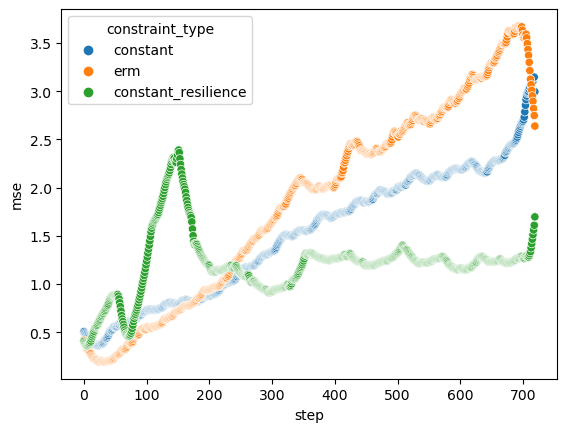

In [ ]:
# filter df_to_plot and summary_metrics to only include autoformer exchange 96 test
summary_debug = summary_metrics.query('model=="Autoformer" and data_path=="exchange_rate.csv" and pred_len==720 and split=="test"').copy()
df_debug = df_to_plot.query('model=="Autoformer" and data_path=="exchange_rate.csv" and pred_len==720 and split=="test"').copy()

display(summary_debug)
display(df_debug.shape)
sns.scatterplot(df_debug,x='step',y='mse',hue='constraint_type')

In [ ]:
df_debug.groupby(['split'])['mse'].mean()

split
test    1.522253
Name: mse, dtype: float64